#Import libraries

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import chi2_contingency
from scipy.stats import mannwhitneyu

#Loading function

In [4]:
def load_data(file_path):
    return pd.read_csv(file_path, delimiter=';')

##Calling data set

In [5]:
df_cardio=load_data("cardio_train.csv")

#Numerical and Categorical columns

In [6]:
numerical_columns = ["age", "height", "weight", "ap_hi", "ap_lo"]
categorical_columns=["gender" , "cholesterol" , "gluc",  "smoke" , "alco" , "active" , "cardio" ]

#Finding_primary_information

In [7]:
def finding_primary_information(df_cardio):
    print(f"df_cardio_head(10) =\n  {df_cardio.head(10)}")
    print(f"df_cardio_tail(10) =\n {df_cardio.tail(10)}")
    print(f"df_cardio_10 sample =\n {df_cardio.sample(10)}")
    print(f"df_cardio_shape =\n {df_cardio.shape}")
    print(f"df_cardio_dimention =\n {df_cardio.ndim}") 
    print("Dataset Information  befor data manipulation = ")
    df_cardio.info()
    print(f"df cardio statistical befor data manipulation: \n {df_cardio.describe()}")

##Calling primary information

In [8]:
finding_primary_information(df_cardio)

df_cardio_head(10) =
     id    age  gender  height  weight  ap_hi  ap_lo  cholesterol  gluc  smoke  \
0   0  18393       2     168    62.0    110     80            1     1      0   
1   1  20228       1     156    85.0    140     90            3     1      0   
2   2  18857       1     165    64.0    130     70            3     1      0   
3   3  17623       2     169    82.0    150    100            1     1      0   
4   4  17474       1     156    56.0    100     60            1     1      0   
5   8  21914       1     151    67.0    120     80            2     2      0   
6   9  22113       1     157    93.0    130     80            3     1      0   
7  12  22584       2     178    95.0    130     90            3     3      0   
8  13  17668       1     158    71.0    110     70            1     1      0   
9  14  19834       1     164    68.0    110     60            1     1      0   

   alco  active  cardio  
0     0       1       0  
1     0       1       1  
2     0       0   

#Dropping useless columns

In [9]:
def drop_columns(df_cardio):
    df_cardio = df_cardio.drop(columns = ["id"])
    print(df_cardio.columns)
    print("Dataset Information after droping= ")
    df_cardio.info()
    return df_cardio

##dataset manipulating(drop)

In [10]:
df_cardio = drop_columns(df_cardio)

Index(['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol',
       'gluc', 'smoke', 'alco', 'active', 'cardio'],
      dtype='str')
Dataset Information after droping= 
<class 'pandas.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          70000 non-null  int64  
 1   gender       70000 non-null  int64  
 2   height       70000 non-null  int64  
 3   weight       70000 non-null  float64
 4   ap_hi        70000 non-null  int64  
 5   ap_lo        70000 non-null  int64  
 6   cholesterol  70000 non-null  int64  
 7   gluc         70000 non-null  int64  
 8   smoke        70000 non-null  int64  
 9   alco         70000 non-null  int64  
 10  active       70000 non-null  int64  
 11  cardio       70000 non-null  int64  
dtypes: float64(1), int64(11)
memory usage: 6.4 MB


#Finding nulls in the dataset

In [11]:
def null(df_cardio):
    nan_df_cardio = df_cardio.isna()
    sum_nan_df_cardio = df_cardio.isna().sum()
    print(nan_df_cardio)
    print(f"sum of null =\n {sum_nan_df_cardio}")
    return df_cardio

##Calling find null in the dataset

In [13]:
null(df_cardio)

         age  gender  height  weight  ap_hi  ap_lo  cholesterol   gluc  smoke  \
0      False   False   False   False  False  False        False  False  False   
1      False   False   False   False  False  False        False  False  False   
2      False   False   False   False  False  False        False  False  False   
3      False   False   False   False  False  False        False  False  False   
4      False   False   False   False  False  False        False  False  False   
...      ...     ...     ...     ...    ...    ...          ...    ...    ...   
69995  False   False   False   False  False  False        False  False  False   
69996  False   False   False   False  False  False        False  False  False   
69997  False   False   False   False  False  False        False  False  False   
69998  False   False   False   False  False  False        False  False  False   
69999  False   False   False   False  False  False        False  False  False   

        alco  active  cardi

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,17474,1,156,56.0,100,60,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
69995,19240,2,168,76.0,120,80,1,1,1,0,1,0
69996,22601,1,158,126.0,140,90,2,2,0,0,1,1
69997,19066,2,183,105.0,180,90,3,1,0,1,0,1
69998,22431,1,163,72.0,135,80,1,2,0,0,0,1


#Finding Duplicated in the dataset

In [14]:
def duplicated_data(df_cardio):
    duplicated_df_cardio = df_cardio.duplicated()
    sum_duplicated_df_cardio = df_cardio.duplicated().sum()
    print(duplicated_df_cardio)
    print(f"sum of duplication = {sum_duplicated_df_cardio}")
    duplicates = df_cardio[df_cardio.duplicated()]
    print(duplicates.head(24))


##Calling find duplicated data in the dataset

In [15]:
duplicated_data(df_cardio)

0        False
1        False
2        False
3        False
4        False
         ...  
69995    False
69996    False
69997    False
69998    False
69999    False
Length: 70000, dtype: bool
sum of duplication = 24
         age  gender  height  weight  ap_hi  ap_lo  cholesterol  gluc  smoke  \
10562  20495       1     165    70.0    120     80            1     1      0   
21784  16793       1     165    68.0    120     80            1     1      0   
38505  18988       1     164    65.0    120     80            1     1      0   
40365  14552       1     158    64.0    120     80            1     1      0   
42450  18353       1     169    67.0    120     80            1     1      0   
44653  16937       2     170    70.0    120     80            1     1      0   
45125  21280       1     165    65.0    120     80            1     1      0   
45748  22077       1     175    69.0    120     80            1     1      0   
45810  21230       1     164    62.0    120     80            1 

#Removing duplicated in the dataset

In [16]:
def removing_duplicates(df_cardio):
    print(f"dataset shape befor removing duplicates = {df_cardio.shape} ")
    duplicates_index = df_cardio[df_cardio.duplicated()].index
    df_cardio = df_cardio.drop(duplicates_index)
    print(f"dataset shape after removing duplicates = {df_cardio.shape} ")
    return df_cardio

##calling remove duplicats

In [17]:
df_cardio = removing_duplicates(df_cardio)

dataset shape befor removing duplicates = (70000, 12) 
dataset shape after removing duplicates = (69976, 12) 


#Changing age(day) to age(year)

In [18]:
def change_day_to_year (df_cardio):
    df_cardio["age"] = (df_cardio["age"]/365)
    return df_cardio


##Calling change age(day) to age(year)

In [19]:
df_cardio = change_day_to_year(df_cardio)

#Changing Data Types

In [20]:
def changing_datatypes(df_cardio):
    df_cardio_col=df_cardio.columns
    print(df_cardio_col)
    for col in df_cardio_col:
        if col == "age" or col=="weight":
            df_cardio[col] = df_cardio[col].astype("float32")
        elif col == "ap_hi" or col=="ap_lo":
            df_cardio[col] = df_cardio[col].astype("int16")
        else:
            df_cardio[col] = df_cardio[col].astype("uint8")
    return df_cardio

##calling cahnge datatypes

In [21]:
df_cardio=changing_datatypes(df_cardio)

Index(['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol',
       'gluc', 'smoke', 'alco', 'active', 'cardio'],
      dtype='str')


#Statistical and information

In [22]:
def statistical_and_information(df_cardio): 
    print("Dataset Information = ")
    df_cardio.info()
    print(f"df_cardio_statistical: \n {df_cardio.describe()}")

##Calling statistical and information

In [23]:
statistical_and_information(df_cardio)

Dataset Information = 
<class 'pandas.DataFrame'>
Index: 69976 entries, 0 to 69999
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          69976 non-null  float32
 1   gender       69976 non-null  uint8  
 2   height       69976 non-null  uint8  
 3   weight       69976 non-null  float32
 4   ap_hi        69976 non-null  int16  
 5   ap_lo        69976 non-null  int16  
 6   cholesterol  69976 non-null  uint8  
 7   gluc         69976 non-null  uint8  
 8   smoke        69976 non-null  uint8  
 9   alco         69976 non-null  uint8  
 10  active       69976 non-null  uint8  
 11  cardio       69976 non-null  uint8  
dtypes: float32(2), int16(2), uint8(8)
memory usage: 1.9 MB
df_cardio_statistical: 
                 age        gender        height        weight         ap_hi  \
count  69976.000000  69976.000000  69976.000000  69976.000000  69976.000000   
mean      53.339588      1.349648    164.359152     7

#Histogram plot

In [24]:
def hist_data(df_cardio):
    #numerical_columns = ["age", "height", "weight", "ap_hi", "ap_lo"]
    plt.figure(figsize=(10, 7))
    for col in range (len(numerical_columns)):
        sns.histplot(df_cardio , x = numerical_columns[col])
        plt.title(f"Histogram Plot of {numerical_columns[col]}")
        plt.tight_layout()
        plt.show()

##Calling histogram plot

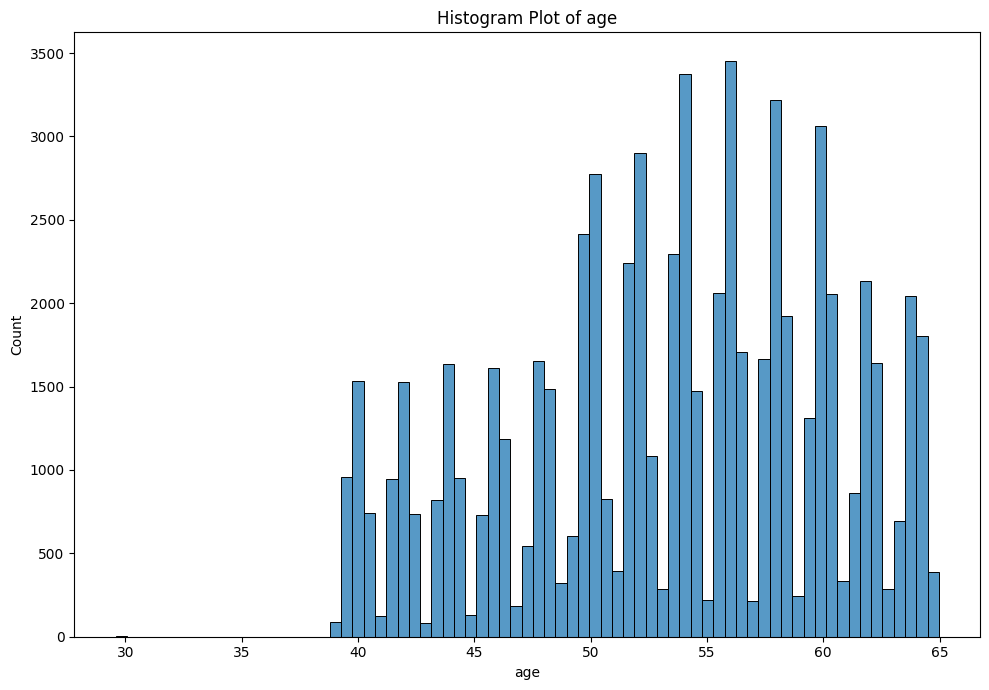

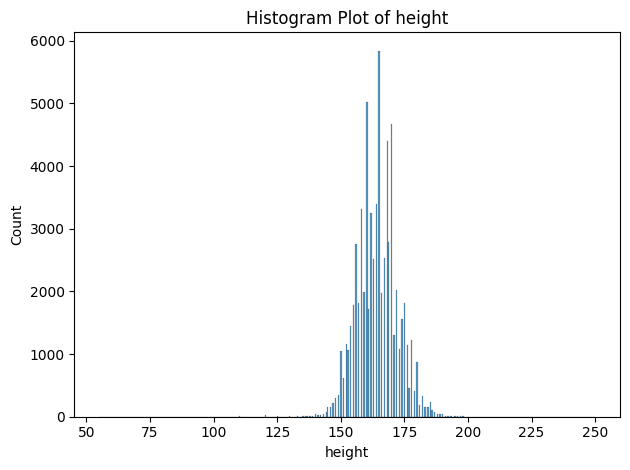

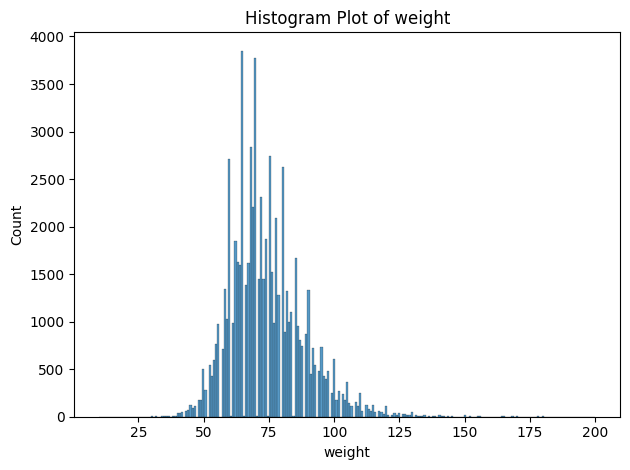

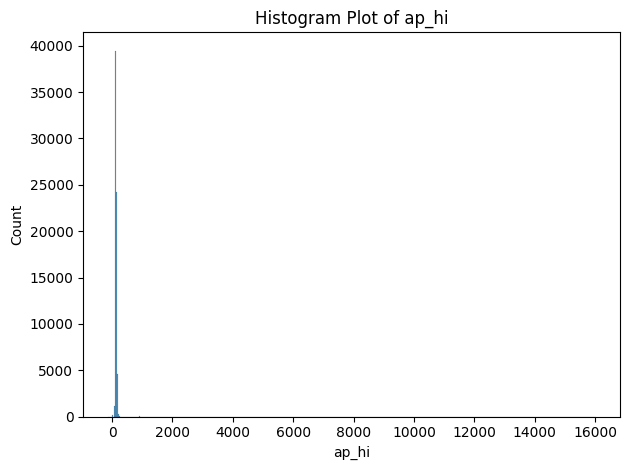

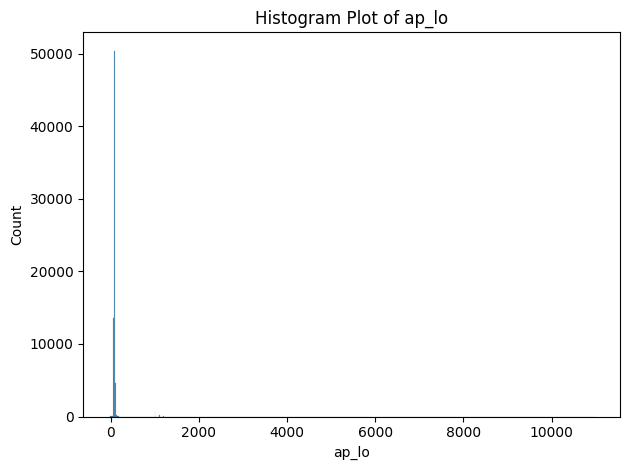

In [25]:
hist_data(df_cardio)

#box plot

In [26]:
def box_plot(df_cardio ):
      #numerical_columns = ["age", "height", "weight", "ap_hi", "ap_lo"]
      plt.figure(figsize=(10, 7))
      for col in range(len(numerical_columns)):
          sns.boxplot(df_cardio , y=numerical_columns[col])
          plt.title(f"Box Plot of {numerical_columns[col]}")
          plt.tight_layout()
          plt.show()  

#Calling Box plot

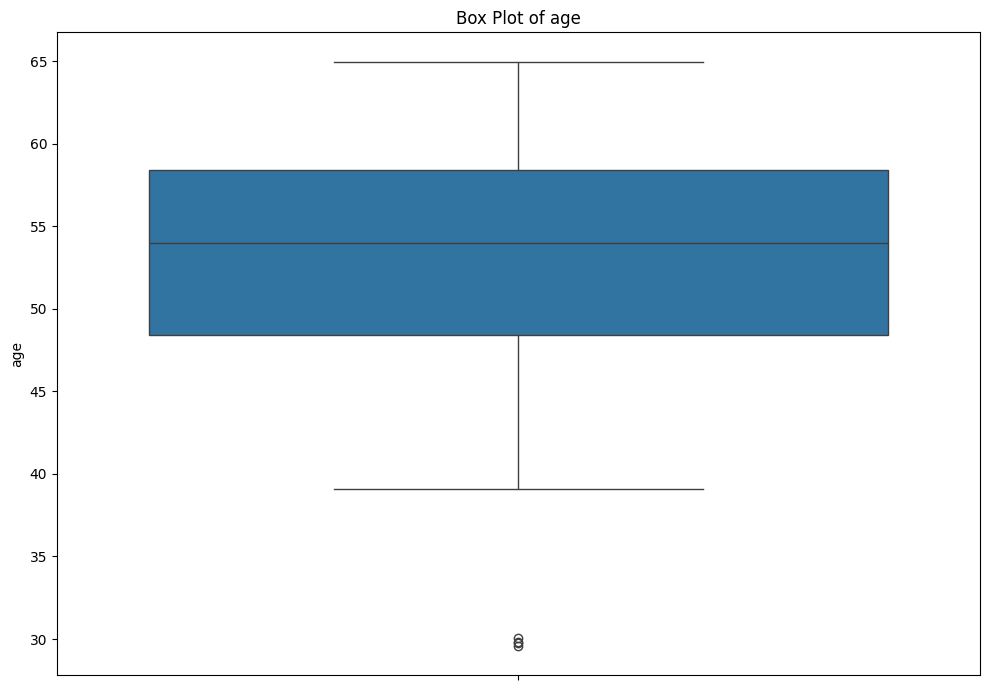

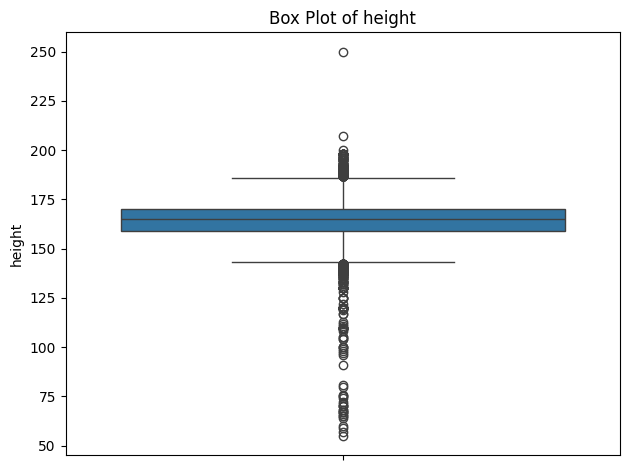

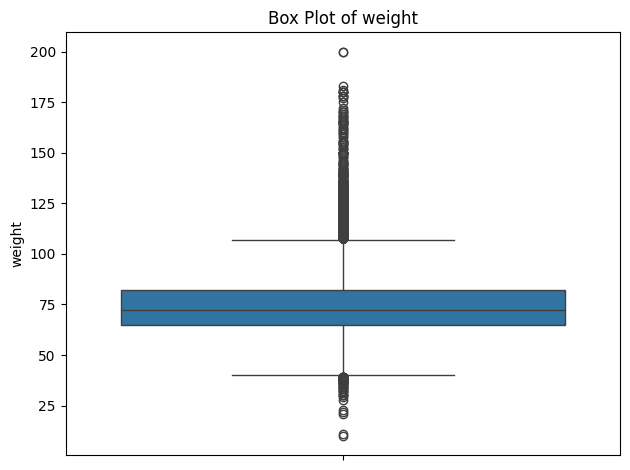

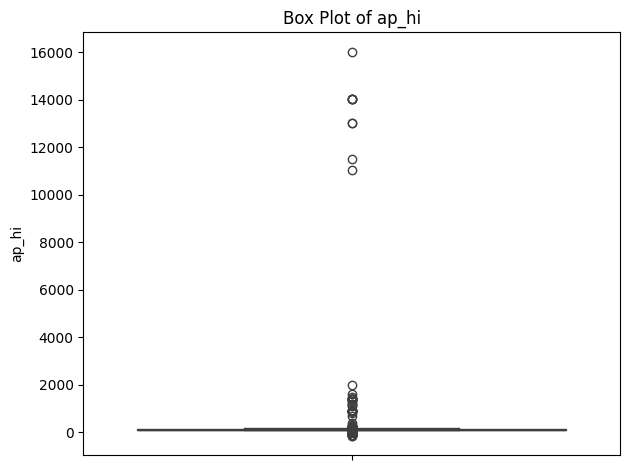

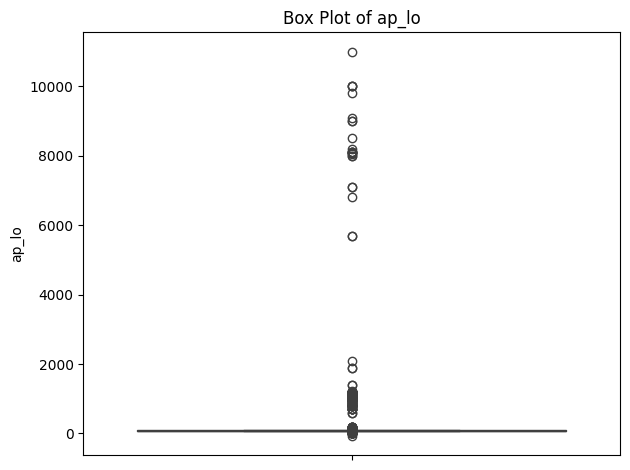

In [27]:
box_plot(df_cardio)

#Calculating outliers with IQR approach

In [28]:
def IQR_calculat(df_cardio):
    upper_bond={}
    lower_bond={}
    IQR_val={}
    numerical_columns = ["age", "height", "weight", "ap_hi", "ap_lo"]
    for cols in numerical_columns:
        Q1= np.quantile(df_cardio[cols], 0.25 )
        Q3= np.quantile(df_cardio[cols] , 0.75)
        IQR_val[cols]=Q3-Q1
        upper_bond[cols]=Q3+(1.5*IQR_val[cols])
        lower_bond[cols]=Q1-(1.5*IQR_val[cols])
    plt.figure(figsize=(10,7))
    for cols in range(len(numerical_columns)):
        sns.scatterplot(x = df_cardio[numerical_columns[cols]].index , y = df_cardio[numerical_columns[cols]])
        plt.hlines(y = upper_bond[numerical_columns[cols]],
                   xmin=df_cardio.index.min() ,
                   xmax=df_cardio.index.max() , 
                   colors= "red" , 
                   linestyles= "dashed" , 
                   label="Upper bond"
                   )
        plt.hlines(y= lower_bond[numerical_columns[cols]] ,
                    xmin=df_cardio.index.min() ,
                    xmax=df_cardio.index.max() , 
                    colors= "black" , 
                    linestyles= "dashed" , 
                    label="Lower bond"
                    )
        plt.xlabel("Sample Index")
        plt.title(numerical_columns[cols])
        plt.legend()
        plt.tight_layout()
        plt.show()

##Calling calculate IQR for data

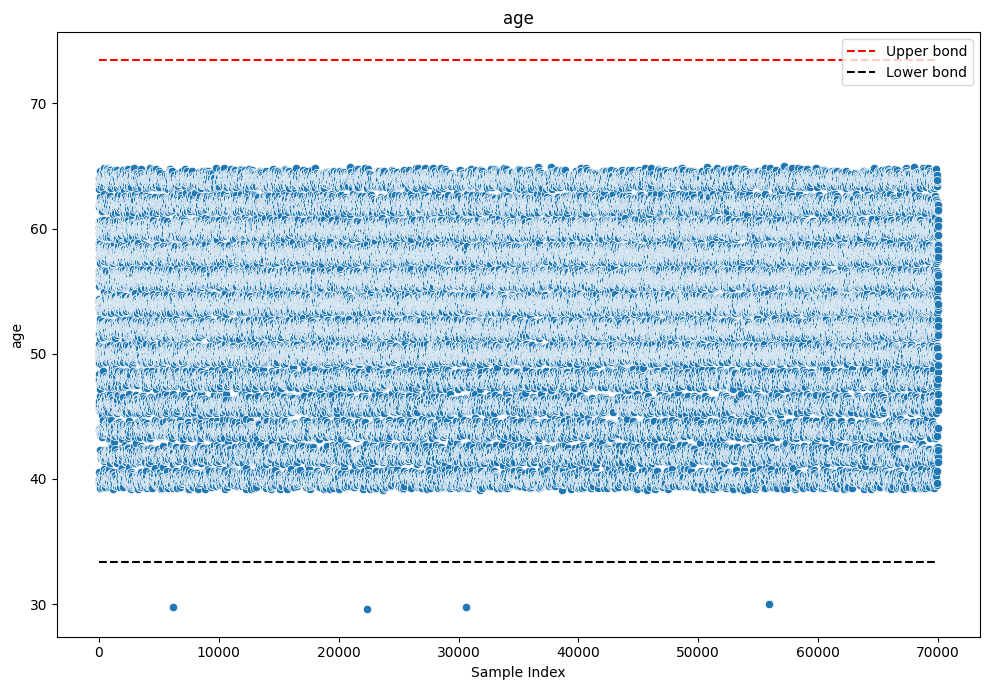

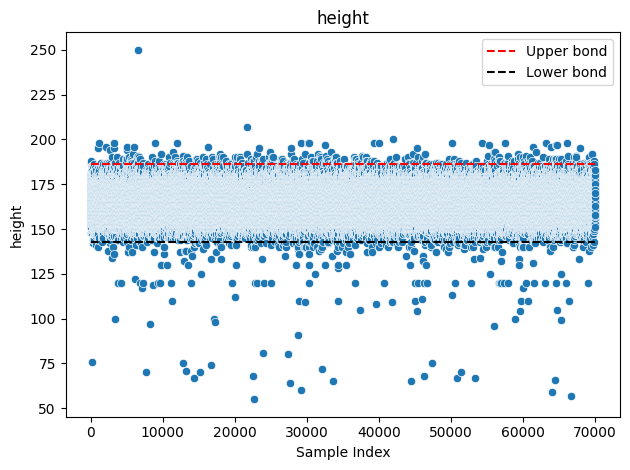

C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\1726153339.py:32: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


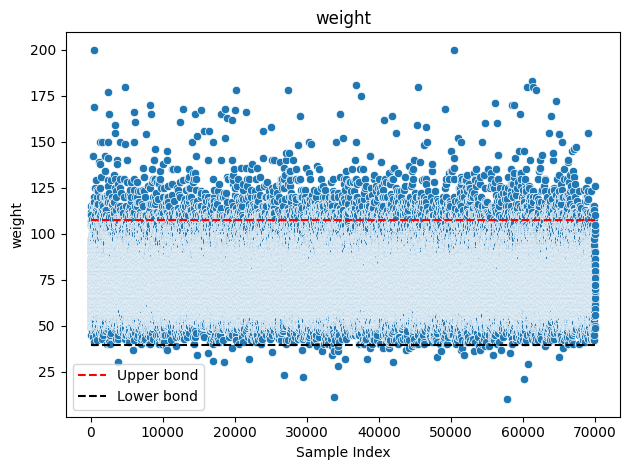

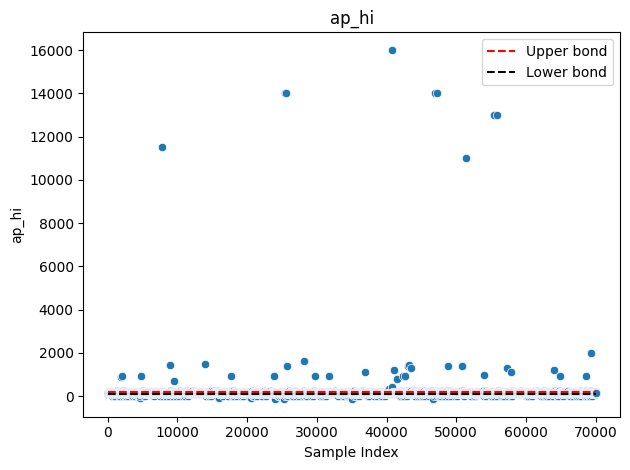

C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\1726153339.py:32: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
c:\Users\MY HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


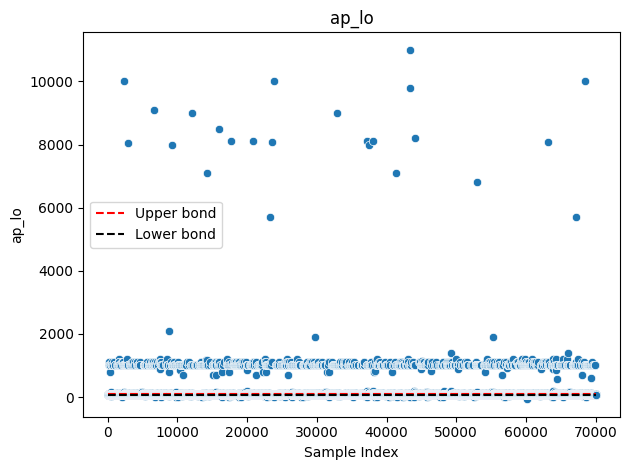

In [29]:
IQR_calculat(df_cardio)

#Deleting illogical values in ap_hi and ap_lo in term of medical criteria

In [30]:
""" Outliers were not removed from the age, height, and weight columns 
because these values may represent real people. 
However, the ap_hi and ap_lo columns contain many illogical or medically impossible values. 
Therefore, these variables will be cleaned according to medical knowledge instead of relying only on the IQR method. """
def deleted_illogical_values(df_cardio):
    #numerical_columns = ["age", "height", "weight", "ap_hi", "ap_lo"]
    invalid_rows = df_cardio[
    (df_cardio["ap_hi"] < 70) |
    (df_cardio["ap_hi"] > 250) |
    (df_cardio["ap_lo"] < 40) |
    (df_cardio["ap_lo"] > 150) |
    (df_cardio["ap_hi"] <= df_cardio["ap_lo"])]
    print(f"invalid rows =\n {invalid_rows}")
    print(f"shape of invalid rows = {invalid_rows.shape}")
    df_cardio = df_cardio.drop(invalid_rows.index)
          #------ calculating IQR after removing illogical data in medical criteria with calling IQR_calculat function---#
    IQR_calculat(df_cardio)
    print("Dataset Information after removing  illogical ap_hi and ap_lo : ")
    df_cardio.info()
    print(f"df cardio statistical after removing  illogical ap_hi and ap_lo : \n {df_cardio.describe()}")
    return df_cardio

##Calling remove illogical values in ap_hi and ap_lo

invalid rows =
              age  gender  height  weight  ap_hi  ap_lo  cholesterol  gluc  \
228    47.915070       2     183    98.0    160   1100            1     2   
241    60.087669       2     157    60.0    160   1000            2     1   
260    49.909588       1     150    83.0    140    800            1     1   
329    64.128769       1     176    63.0    160   1000            2     2   
345    51.243835       1     154    81.0    140   1000            2     1   
...          ...     ...     ...     ...    ...    ...          ...   ...   
69771  63.917809       1     167    81.0    160   1000            1     1   
69872  59.747944       1     152    56.0    160   1000            1     1   
69878  58.189041       2     168    95.0    160   1000            1     1   
69885  61.416439       2     166    78.0    170   1000            1     1   
69967  58.673973       2     168    63.0    140   1000            1     1   

       smoke  alco  active  cardio  
228        1     0    

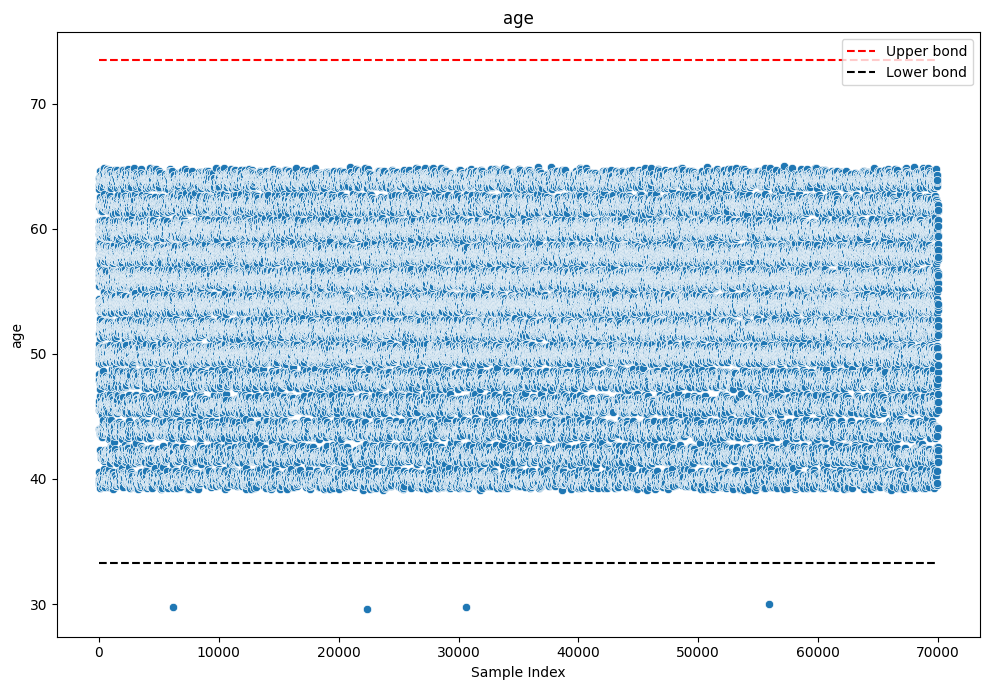

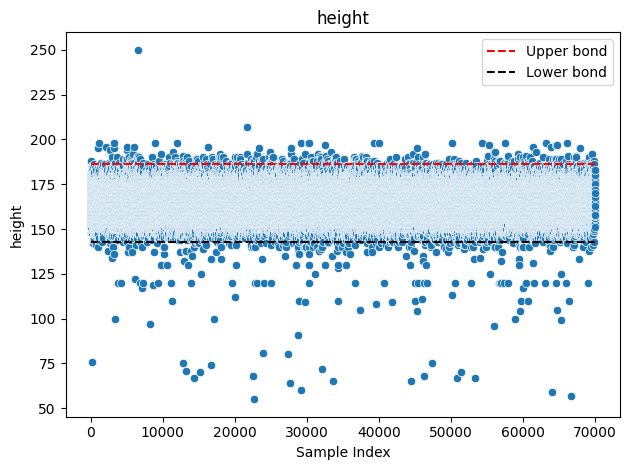

C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\1726153339.py:32: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
c:\Users\MY HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


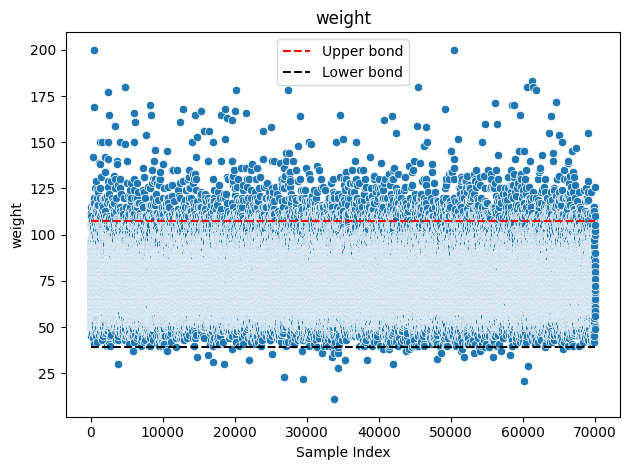

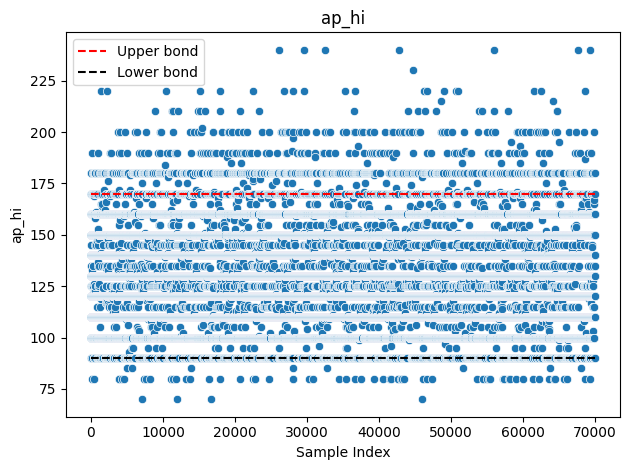

C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\1726153339.py:32: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
c:\Users\MY HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


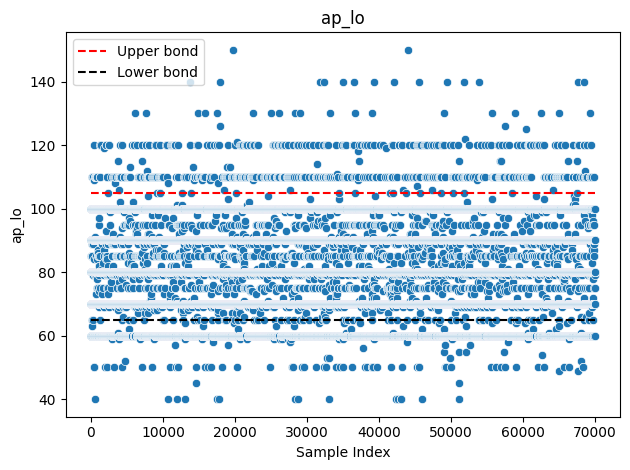

Dataset Information after removing  illogical ap_hi and ap_lo : 
<class 'pandas.DataFrame'>
Index: 68642 entries, 0 to 69999
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          68642 non-null  float32
 1   gender       68642 non-null  uint8  
 2   height       68642 non-null  uint8  
 3   weight       68642 non-null  float32
 4   ap_hi        68642 non-null  int16  
 5   ap_lo        68642 non-null  int16  
 6   cholesterol  68642 non-null  uint8  
 7   gluc         68642 non-null  uint8  
 8   smoke        68642 non-null  uint8  
 9   alco         68642 non-null  uint8  
 10  active       68642 non-null  uint8  
 11  cardio       68642 non-null  uint8  
dtypes: float32(2), int16(2), uint8(8)
memory usage: 1.8 MB
df cardio statistical after removing  illogical ap_hi and ap_lo : 
                 age        gender        height        weight         ap_hi  \
count  68642.000000  68642.000000  68642.000000

In [31]:
df_cardio = deleted_illogical_values(df_cardio)

#Showimg categorical data

In [32]:
def categorical_df_cardio(df_cardio):
    #categorical_columns=["gender" , "cholesterol" , "gluc",  "smoke" , "alco" , "active" , "cardio" ]
    labels = {
        "gender": ["Female", "Male"],
        "cholesterol":["Normal", "Above Normal" , "Well Above Normal"],
        "gluc":["Normal", "Above Normal" , "Well Above Normal"],
        "smoke": ["No", "Yes"],
        "alco": ["No", "Yes"],
        "active": ["No", "Yes"],
        "cardio": ["No Disease", "Disease"]
    }
    plt.figure(figsize=(15,8))
    for cols in range(len(categorical_columns)):
        print(f" value count = {categorical_columns[cols]} \n {df_cardio[categorical_columns[cols]].value_counts()}")
        ax=sns.countplot(data=df_cardio, x=categorical_columns[cols] , color = "red")
        ax.set_xticklabels(labels[categorical_columns[cols]])
        for container in ax.containers:
            ax.bar_label(container, fontsize=8)
        plt.title(f"Count Plot of {categorical_columns[cols]}")
        plt.tight_layout()
        plt.show()
    return df_cardio

##Calling show categorical data

 value count = gender 
 gender
1    44706
2    23936
Name: count, dtype: int64


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\1882679357.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[categorical_columns[cols]])


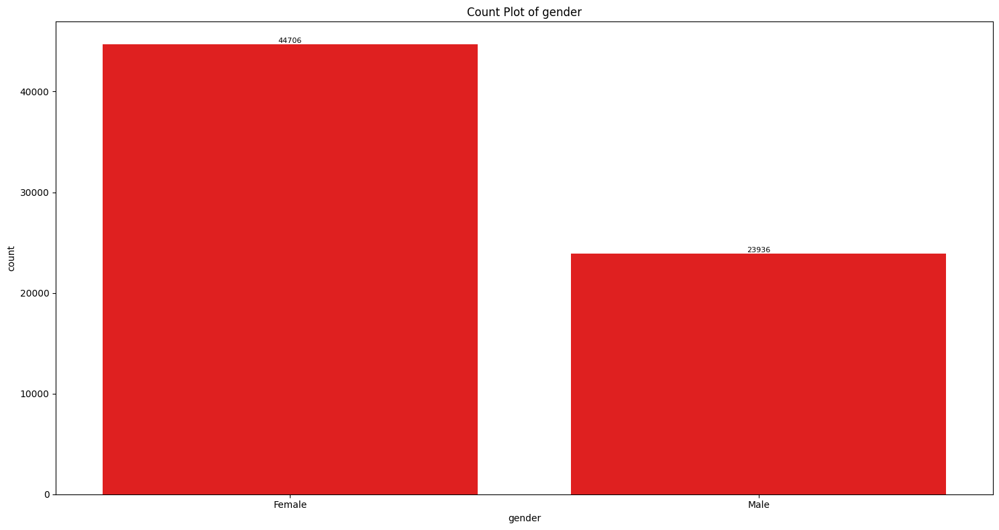

 value count = cholesterol 
 cholesterol
1    51473
2     9300
3     7869
Name: count, dtype: int64


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\1882679357.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[categorical_columns[cols]])


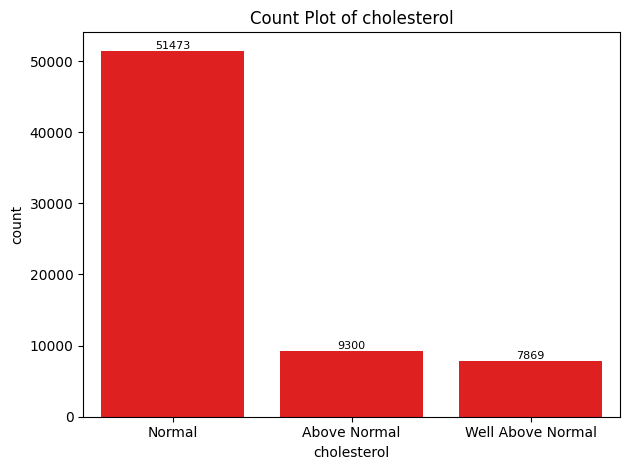

 value count = gluc 
 gluc
1    58362
3     5215
2     5065
Name: count, dtype: int64


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\1882679357.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[categorical_columns[cols]])


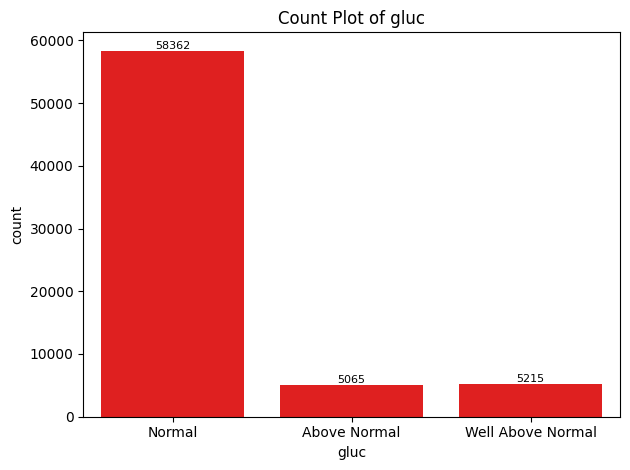

 value count = smoke 
 smoke
0    62601
1     6041
Name: count, dtype: int64


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\1882679357.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[categorical_columns[cols]])


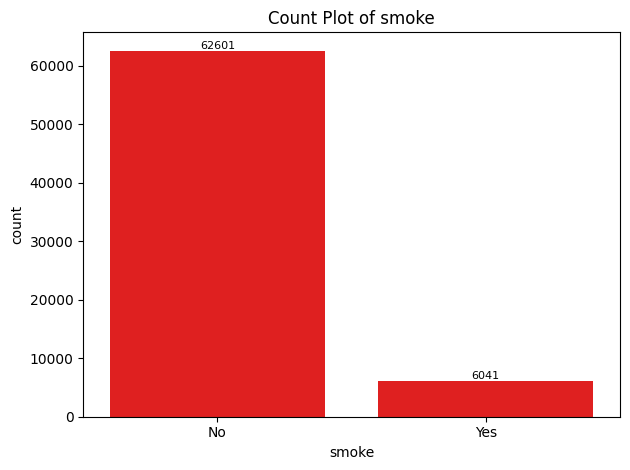

 value count = alco 
 alco
0    64978
1     3664
Name: count, dtype: int64


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\1882679357.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[categorical_columns[cols]])


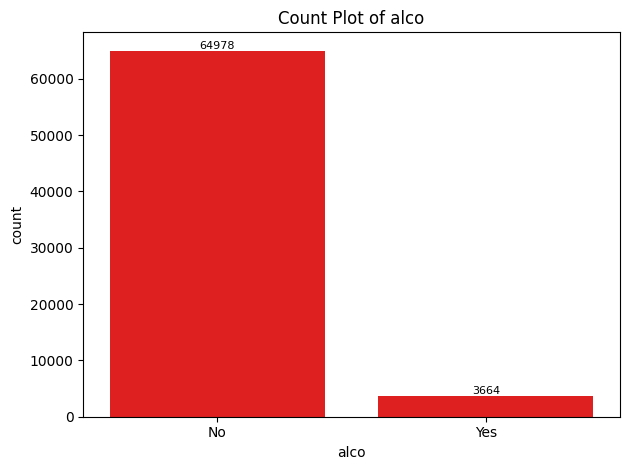

 value count = active 
 active
1    55144
0    13498
Name: count, dtype: int64


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\1882679357.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[categorical_columns[cols]])


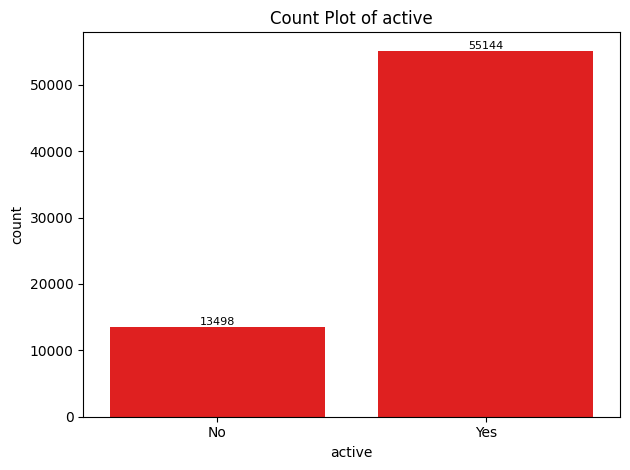

 value count = cardio 
 cardio
0    34680
1    33962
Name: count, dtype: int64


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\1882679357.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[categorical_columns[cols]])


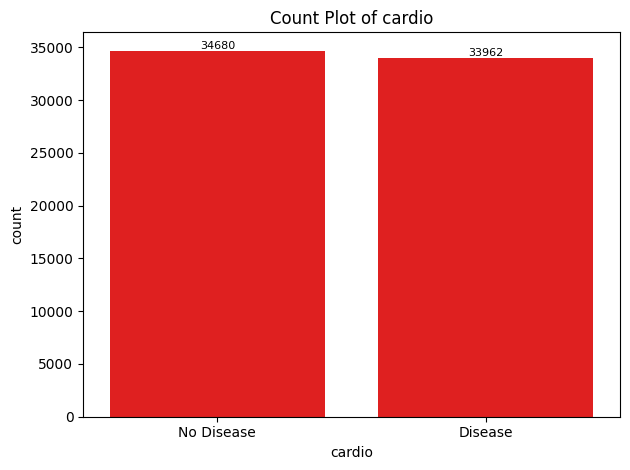

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,50.391781,2,168,62.0,110,80,1,1,0,0,1,0
1,55.419178,1,156,85.0,140,90,3,1,0,0,1,1
2,51.663013,1,165,64.0,130,70,3,1,0,0,0,1
3,48.282192,2,169,82.0,150,100,1,1,0,0,1,1
4,47.873974,1,156,56.0,100,60,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
69995,52.712330,2,168,76.0,120,80,1,1,1,0,1,0
69996,61.920547,1,158,126.0,140,90,2,2,0,0,1,1
69997,52.235615,2,183,105.0,180,90,3,1,0,1,0,1
69998,61.454796,1,163,72.0,135,80,1,2,0,0,0,1


In [33]:
categorical_df_cardio(df_cardio)

#Pairplot

In [37]:
def pairplot_df_cardio(df_cardio):
    #numerical_columns = ["age", "height", "weight", "ap_hi", "ap_lo"]
    #categorical_columns=["gender" , "cholesterol" , "gluc",  "smoke" , "alco" , "active" , "cardio" ]
    for col_cat in categorical_columns:
        sns.pairplot(df_cardio , vars = numerical_columns , hue = col_cat)
        plt.suptitle(f"Pair Plot by {col_cat}", y=1.02)
        plt.show()

##Calling pair plots

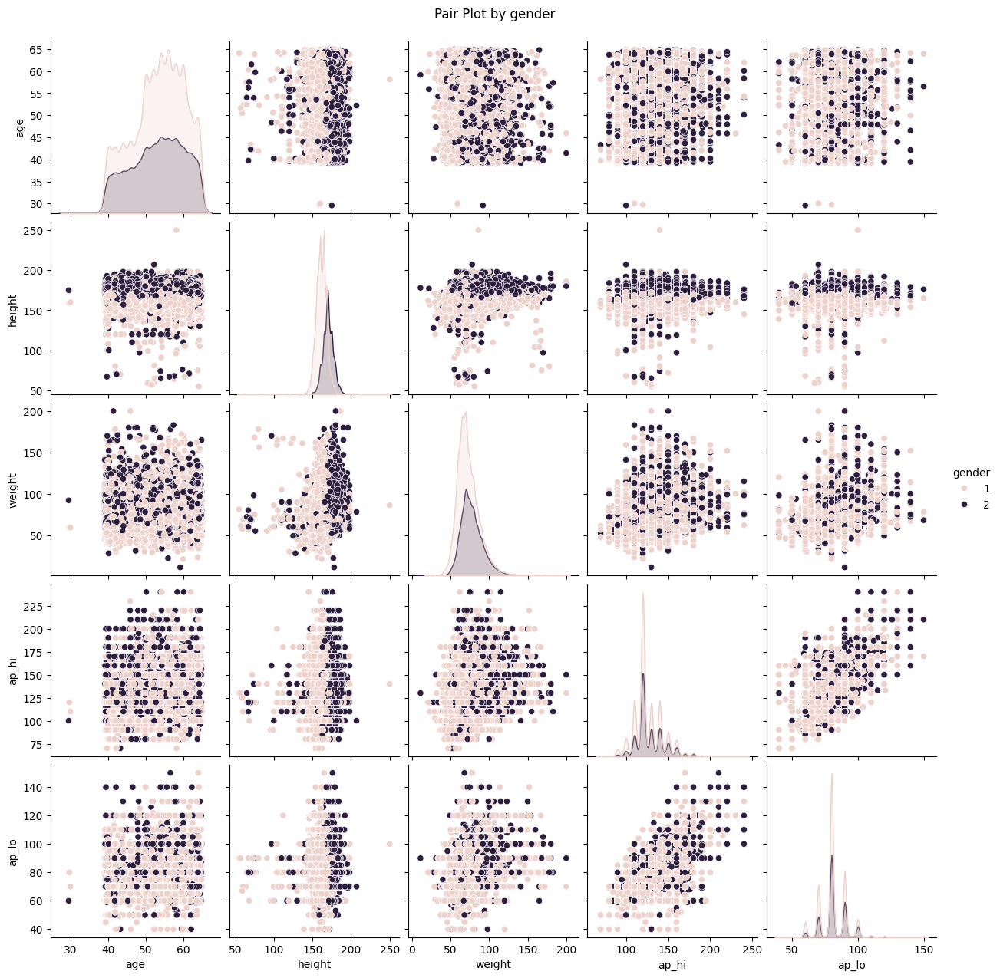

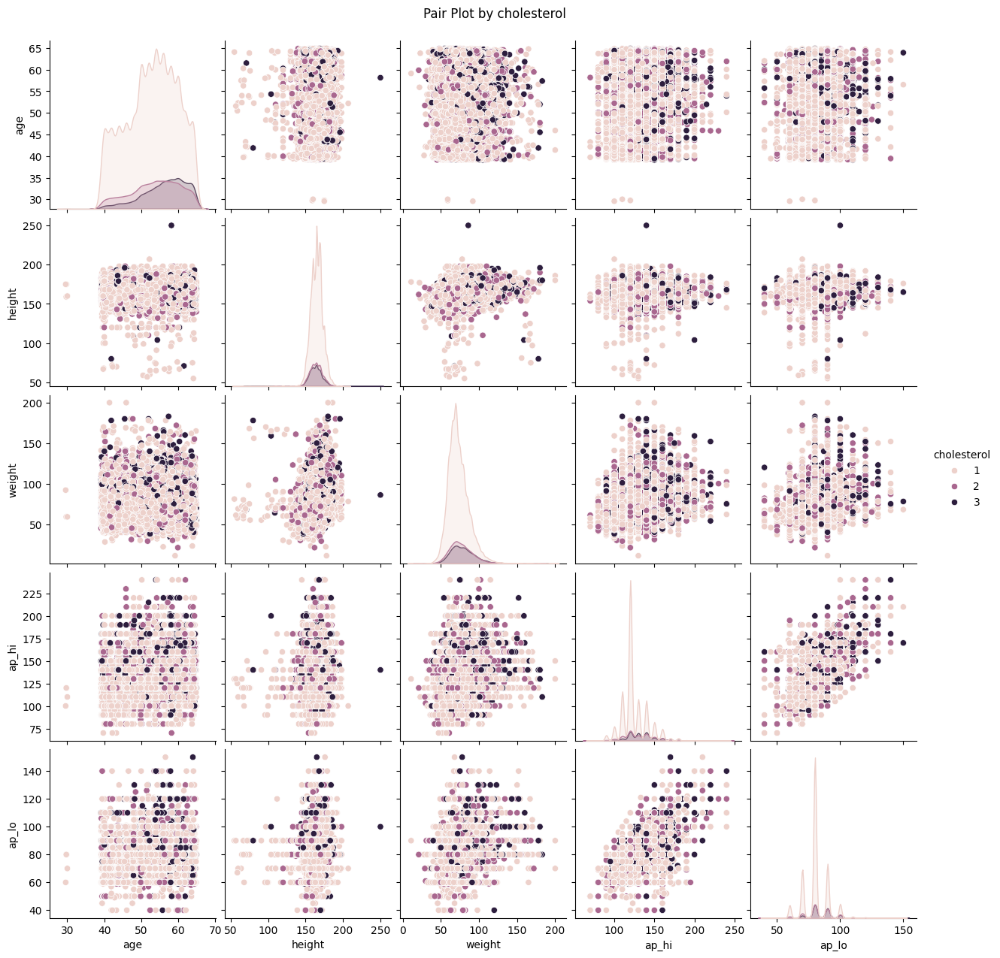

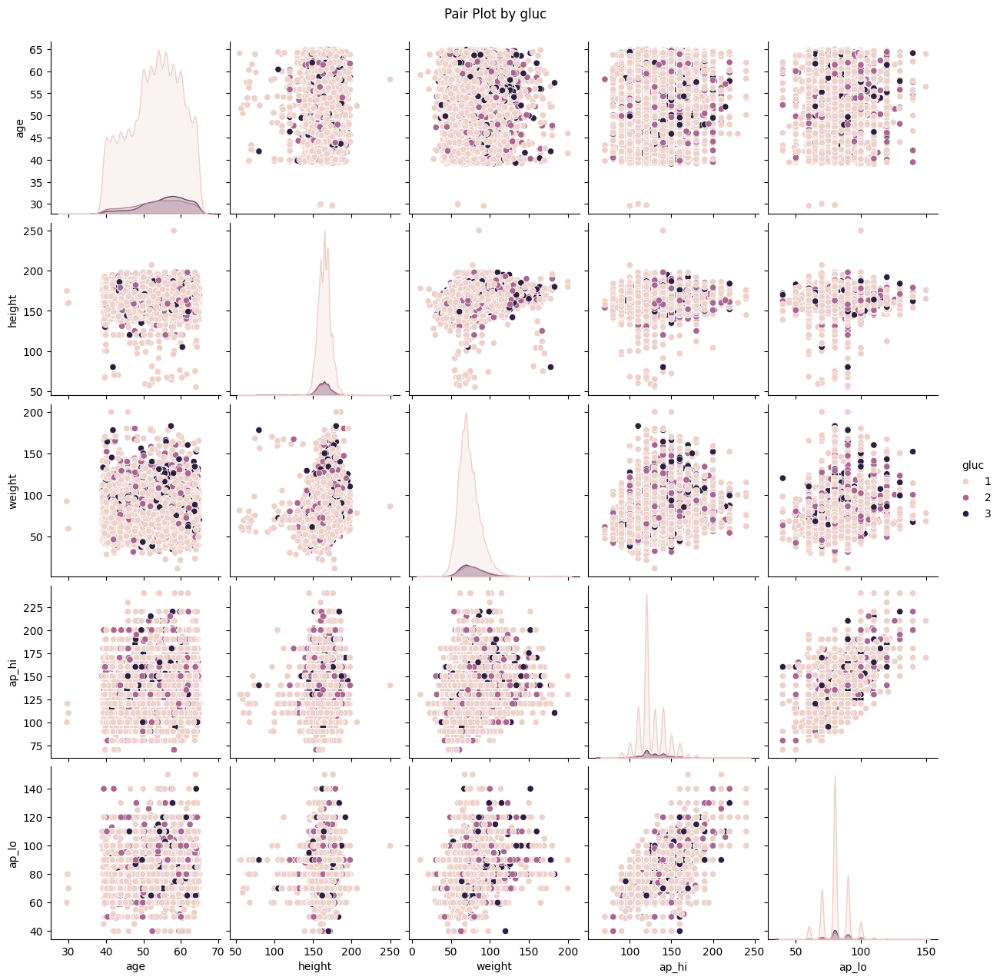

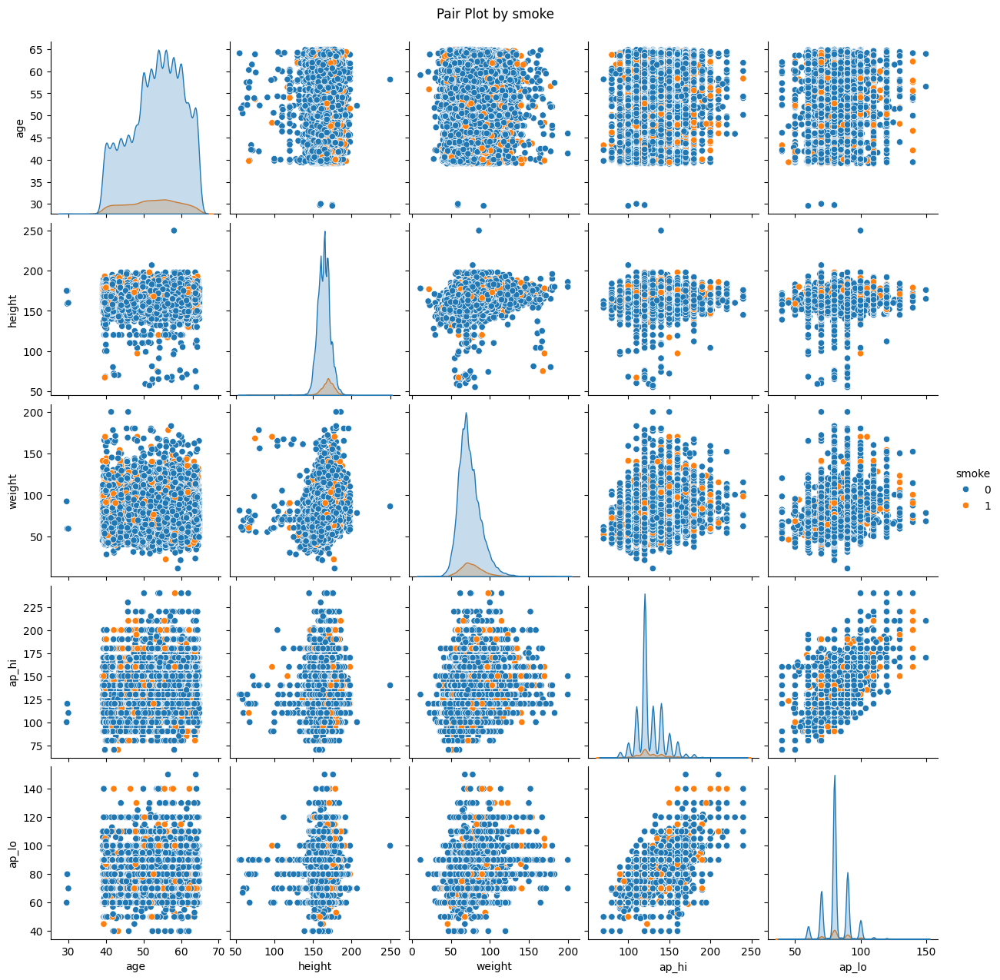

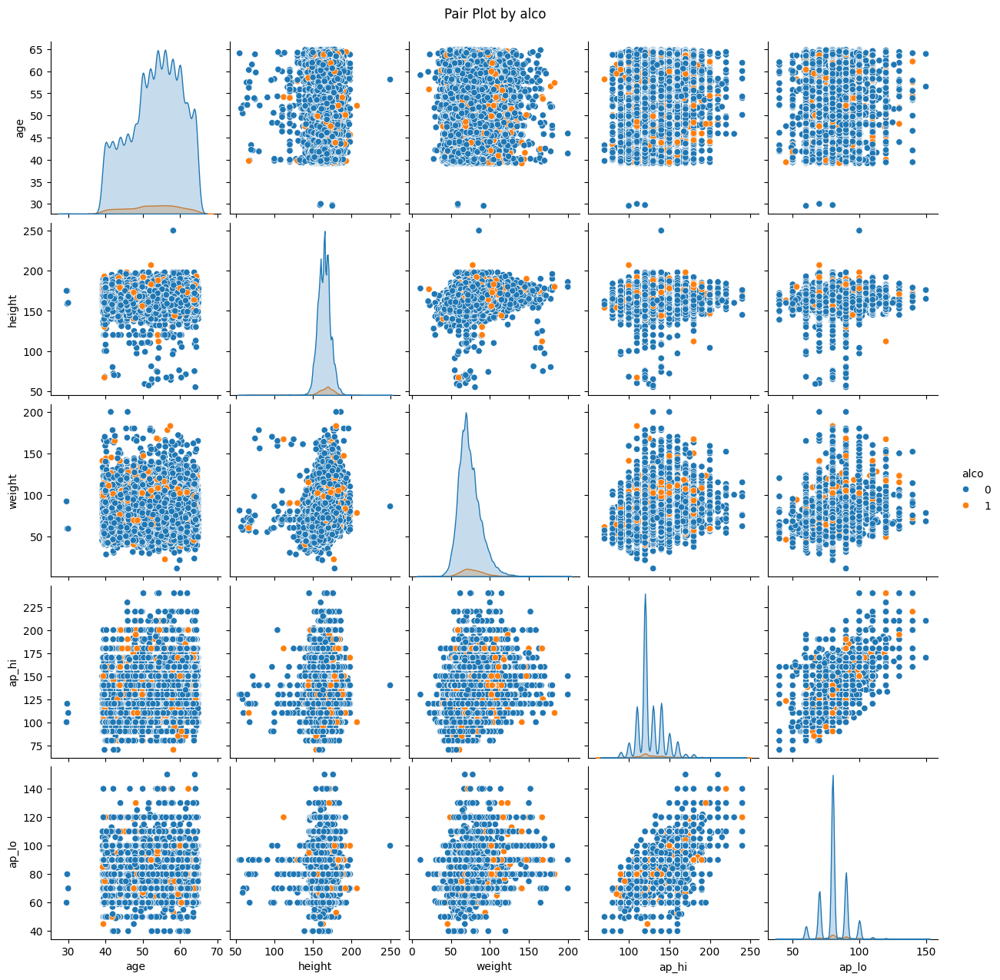

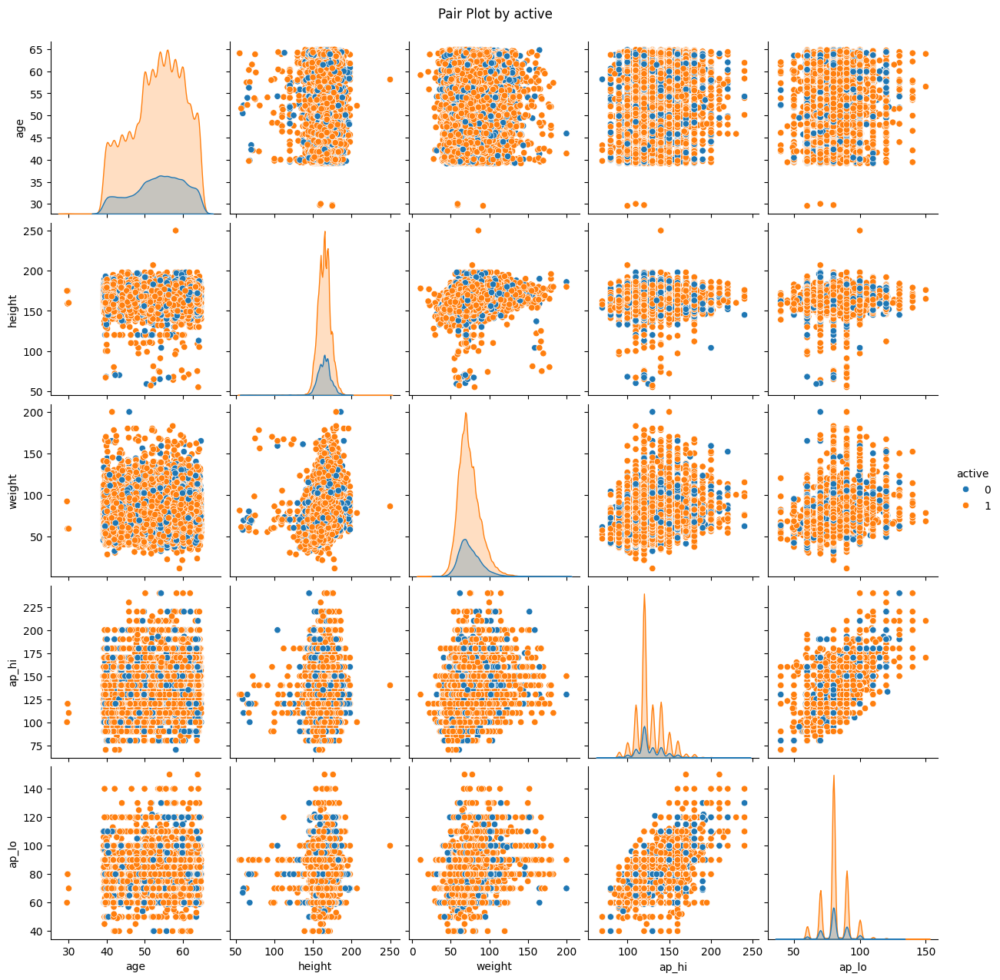

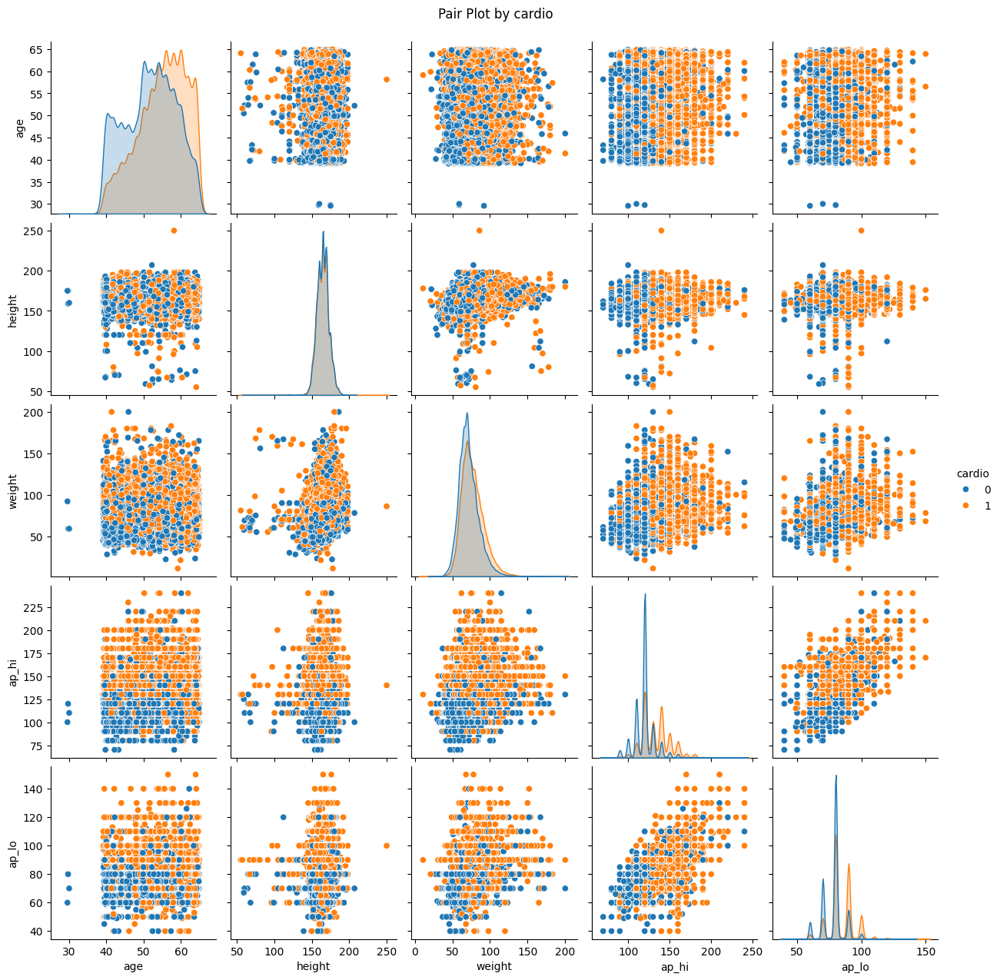

In [38]:
pairplot_df_cardio(df_cardio)

#Calculating corrolation with heatmap

In [39]:
def corr_df_cardio(df_cardio):
    corr_df_cardio= df_cardio.corr()
    plt.figure(figsize=(12,12))
    sns.heatmap(corr_df_cardio , annot = True , fmt = "0.3f" , cmap = "Reds")
    plt.xticks(rotation = 45)
    plt.yticks(rotation = 0)
    plt.show()
    return corr_df_cardio


##CAlling correlation

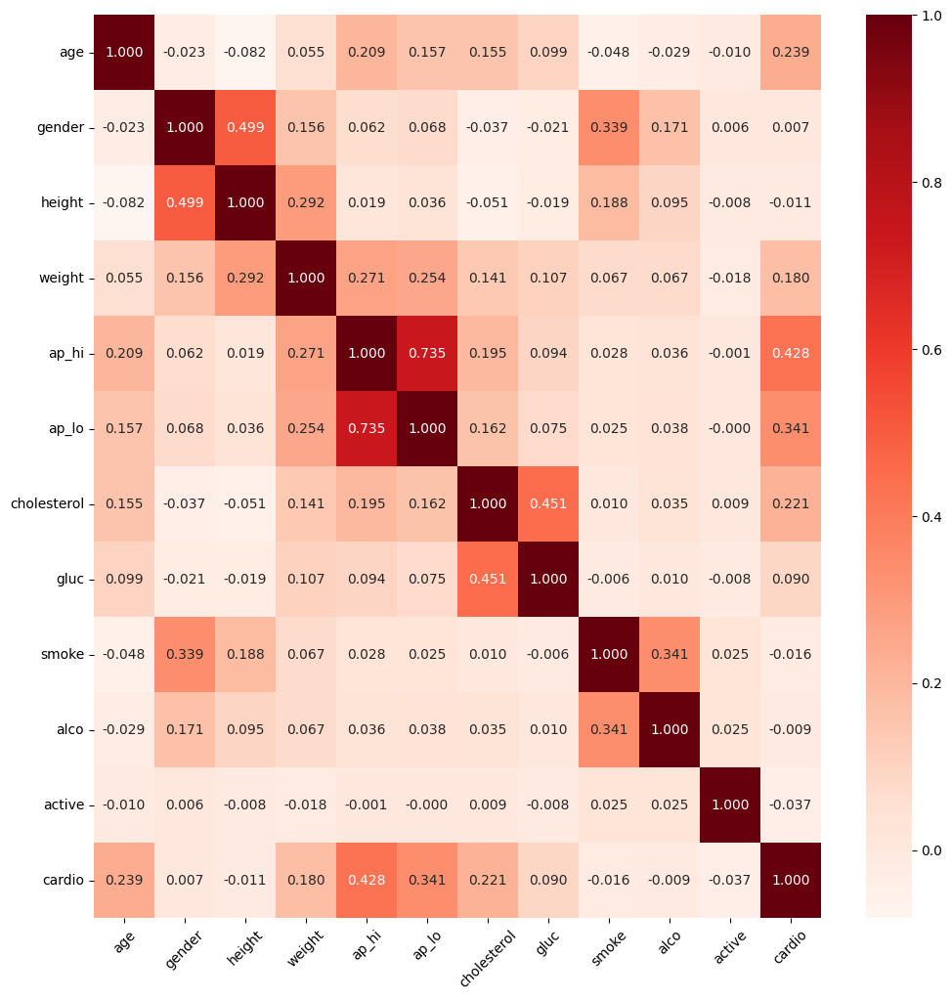

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
age,1.000000,-0.023212,-0.081501,0.054696,0.209364,0.156521,0.155300,0.098842,-0.047717,-0.028837,-0.010223,0.239382
gender,-0.023212,1.000000,0.499108,0.155908,0.062197,0.067609,-0.036917,-0.021244,0.338867,0.171262,0.005988,0.006982
height,-0.081501,0.499108,1.000000,0.291686,0.018647,0.036191,-0.050698,-0.018710,0.188304,0.094637,-0.007506,-0.010792
weight,0.054696,0.155908,0.291686,1.000000,0.271226,0.254342,0.141075,0.107007,0.067000,0.067406,-0.017773,0.179723
ap_hi,0.209364,0.062197,0.018647,0.271226,1.000000,0.734727,0.195246,0.094218,0.027810,0.035591,-0.001147,0.428151
ap_lo,0.156521,0.067609,0.036191,0.254342,0.734727,1.000000,0.161585,0.074619,0.025427,0.037548,-0.000468,0.340838
cholesterol,0.155300,-0.036917,-0.050698,0.141075,0.195246,0.161585,1.000000,0.450533,0.009730,0.034985,0.008560,0.221444
gluc,0.098842,-0.021244,-0.018710,0.107007,0.094218,0.074619,0.450533,1.000000,-0.005908,0.010307,-0.007824,0.089644
smoke,-0.047717,0.338867,0.188304,0.067000,0.027810,0.025427,0.009730,-0.005908,1.000000,0.340522,0.025348,-0.016344
alco,-0.028837,0.171262,0.094637,0.067406,0.035591,0.037548,0.034985,0.010307,0.340522,1.000000,0.024541,-0.008793


In [40]:
corr_df_cardio(df_cardio)

#Relationship beetween categorical data values

In [41]:
def relationship_categorical_values(df_cardio):
    #categorical_columns=["gender" , "cholesterol" , "gluc",  "smoke" , "alco" , "active" , "cardio" ]
    labels = {
        "gender": ["Female", "Male"],
        "cholesterol":["Normal", "Above Normal" , "Well Above Normal"],
        "gluc":["Normal", "Above Normal" , "Well Above Normal"],
        "smoke": ["No", "Yes"],
        "alco": ["No", "Yes"],
        "active": ["No", "Yes"],
        "cardio": ["No Disease", "Disease"]
    }
    plt.figure(figsize=(15,8))
    for col in categorical_columns:
        if col != "cardio":
            group_values=df_cardio.groupby(col)["cardio"].value_counts()
            print(f"droup of {col} and cardio =\n {group_values}")
            table = pd.crosstab(df_cardio[col] , df_cardio["cardio"] , normalize="index") * 100
            print(table.round(3))
            ax = sns.countplot(data=df_cardio, x=col, hue="cardio", stat="percent", palette="Set2")
            ax.set_xticklabels(labels[col])
            handles, legend_labels = ax.get_legend_handles_labels()
            ax.legend(handles , ["No Disease", "Disease"] , title="Cardiovascular")
            for container in ax.containers:
                ax.bar_label(container, fmt="%.3f%%")
            plt.xlabel(col)
            plt.ylabel("Count")
            plt.title(f"{col} vs Cardiovascular Disease")
            plt.tight_layout()
            plt.show()
        else:
            continue

#Calling relationship beetween categorical data values

droup of gender and cardio =
 gender  cardio
1       0         22701
        1         22005
2       0         11979
        1         11957
Name: count, dtype: int64
cardio       0       1
gender                
1       50.778  49.222
2       50.046  49.954


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\3421965922.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[col])


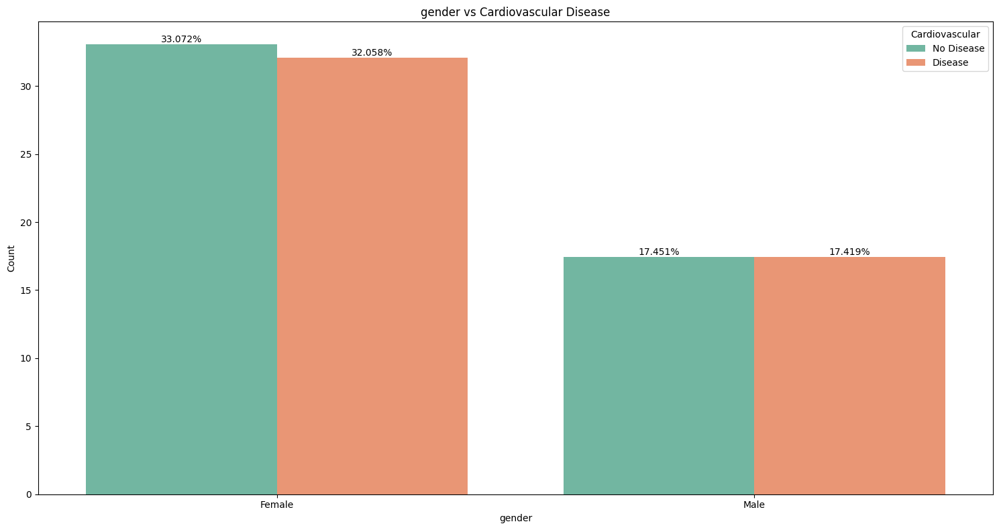

droup of cholesterol and cardio =
 cholesterol  cardio
1            0         29058
             1         22415
2            1          5546
             0          3754
3            1          6001
             0          1868
Name: count, dtype: int64
cardio            0       1
cholesterol                
1            56.453  43.547
2            40.366  59.634
3            23.739  76.261


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\3421965922.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[col])


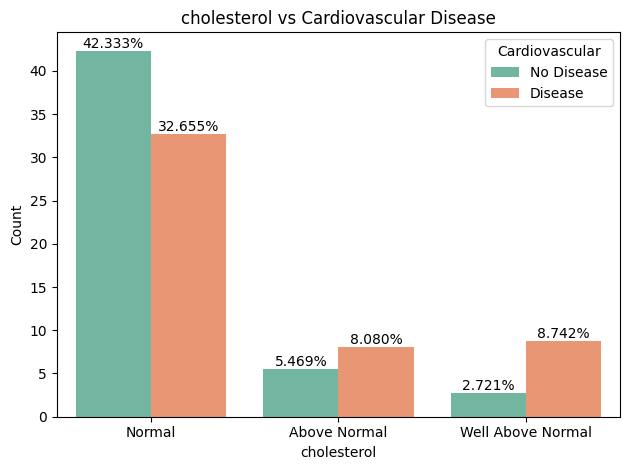

droup of gluc and cardio =
 gluc  cardio
1     0         30603
      1         27759
2     1          2981
      0          2084
3     1          3222
      0          1993
Name: count, dtype: int64
cardio       0       1
gluc                  
1       52.437  47.563
2       41.145  58.855
3       38.217  61.783


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\3421965922.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[col])


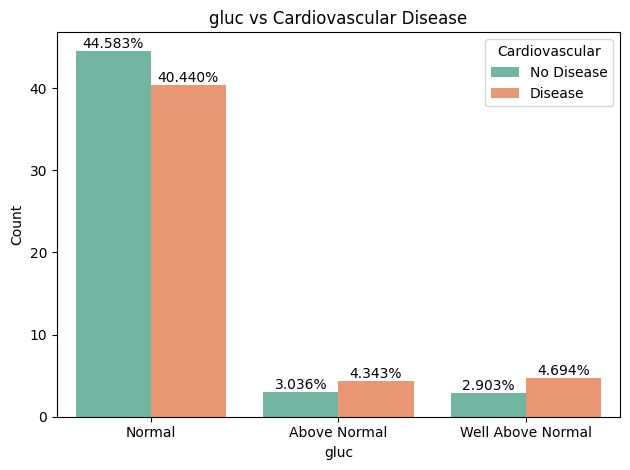

droup of smoke and cardio =
 smoke  cardio
0      0         31469
       1         31132
1      0          3211
       1          2830
Name: count, dtype: int64
cardio       0       1
smoke                 
0       50.269  49.731
1       53.153  46.847


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\3421965922.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[col])


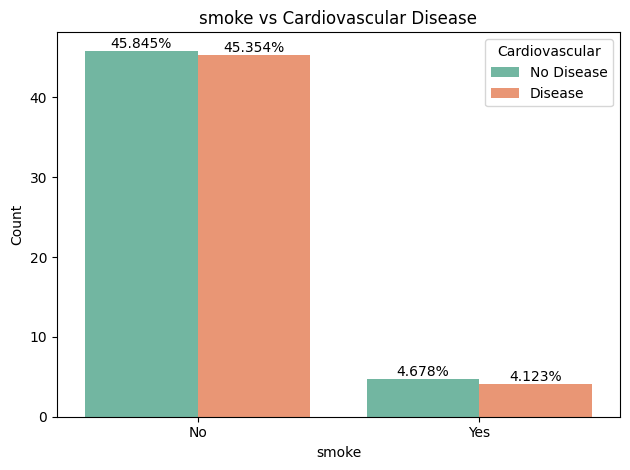

droup of alco and cardio =
 alco  cardio
0     0         32761
      1         32217
1     0          1919
      1          1745
Name: count, dtype: int64
cardio       0       1
alco                  
0       50.419  49.581
1       52.374  47.626


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\3421965922.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[col])


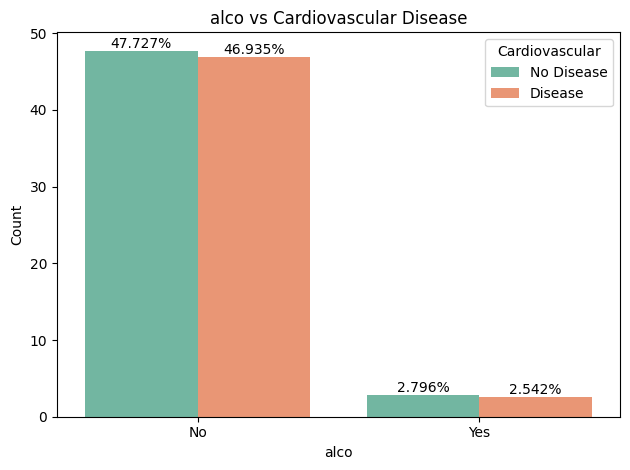

droup of active and cardio =
 active  cardio
0       1          7189
        0          6309
1       0         28371
        1         26773
Name: count, dtype: int64
cardio       0       1
active                
0       46.740  53.260
1       51.449  48.551


C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\3421965922.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels[col])


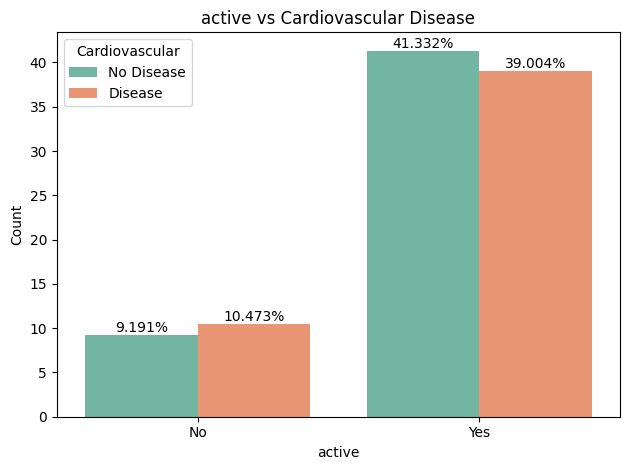

In [43]:
relationship_categorical_values(df_cardio)

#Numerical data analysis distribution

In [44]:
def numerical_df_cardio(df_cardio):
    #numerical_columns = ["age", "height", "weight", "ap_hi", "ap_lo"]
    for col in numerical_columns:
        plt.figure(figsize=(15,8))
        sns.kdeplot(data= df_cardio , x = col , hue = "cardio")
        plt.xlabel(col)
        plt.ylabel("Density")
        plt.title(f"{col} vs Cardiovascular Disease")
        plt.legend(["No Disease", "Disease"])
        plt.tight_layout()
        plt.show()

##Calling numerical data analysis

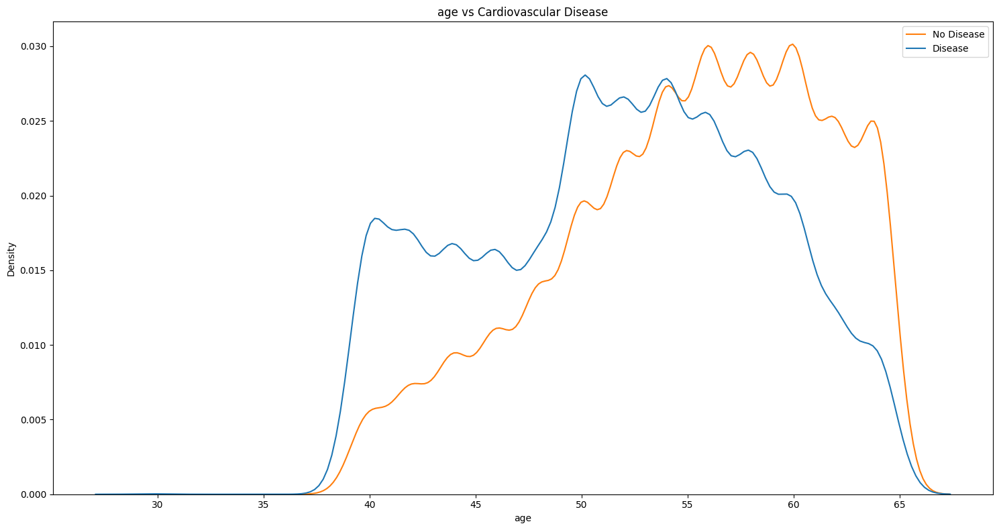

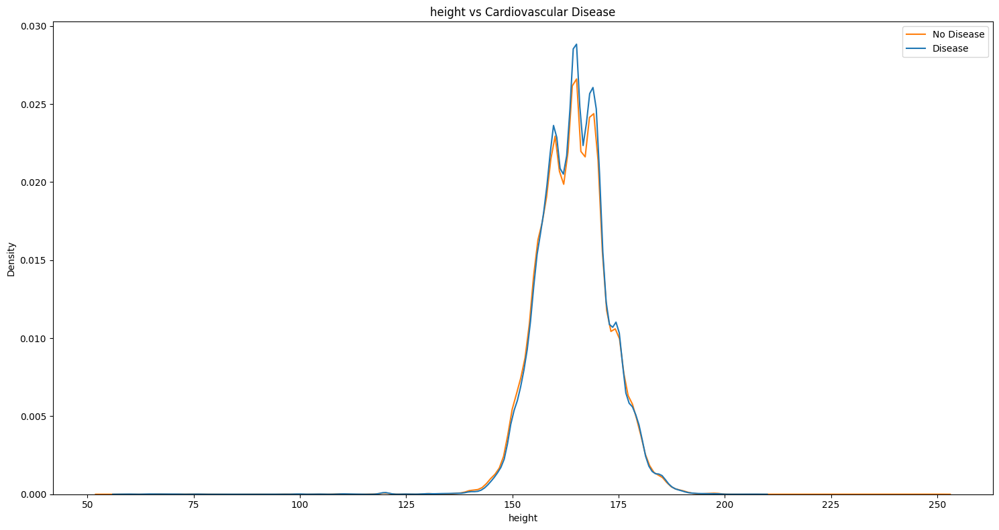

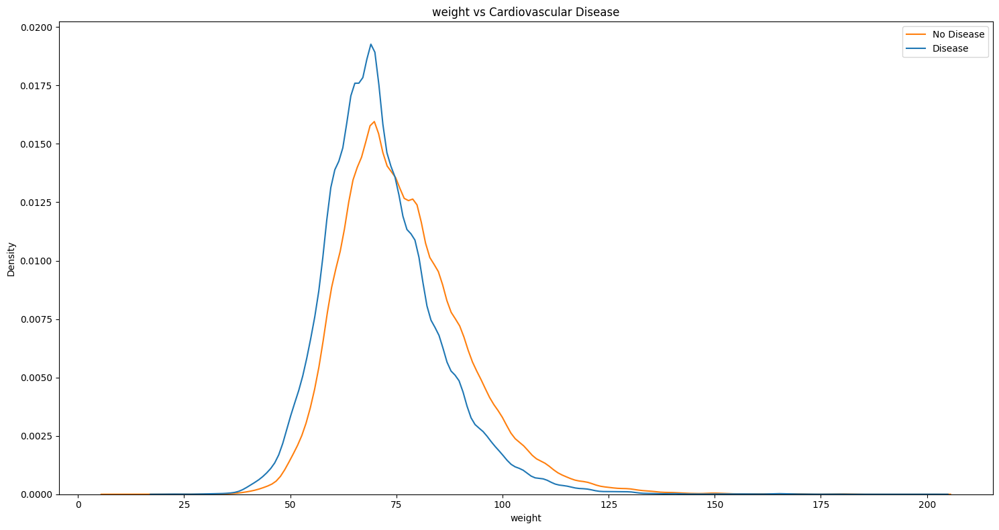

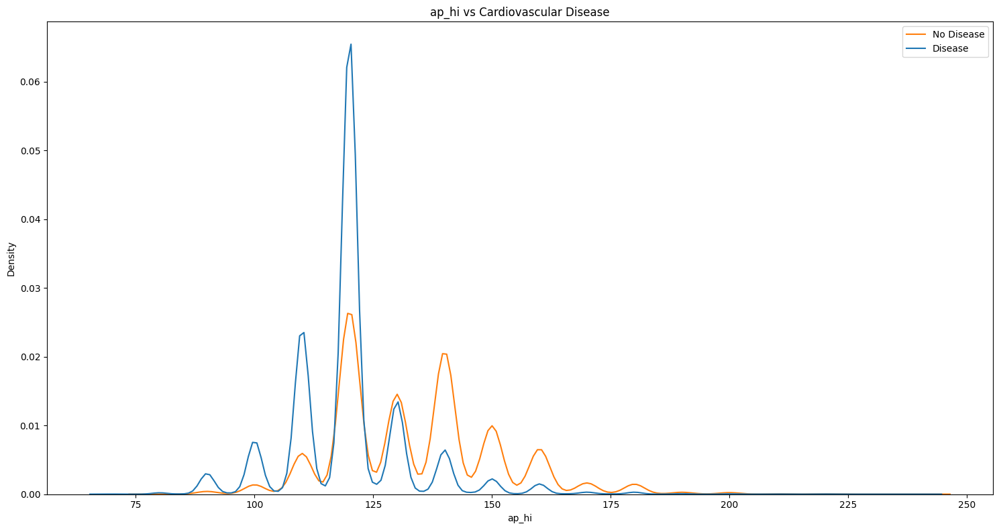

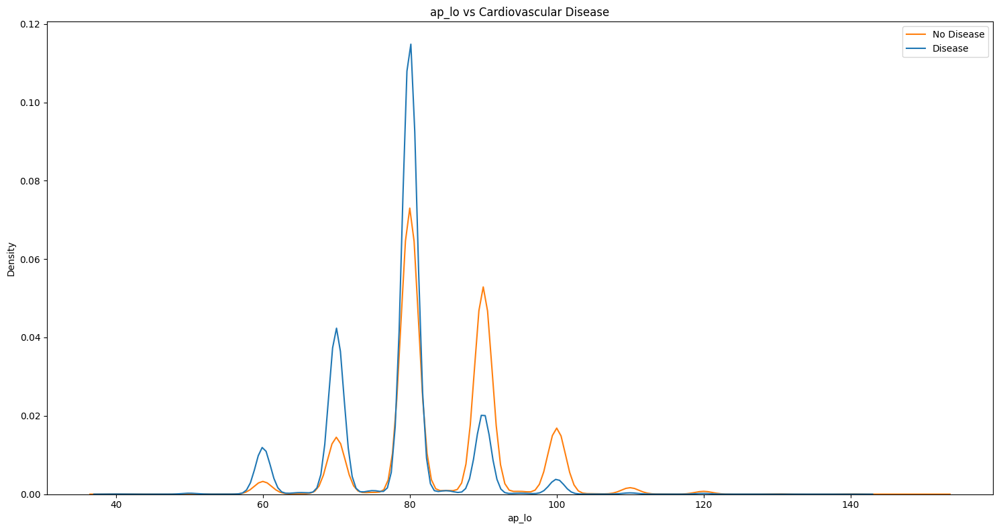

In [45]:
numerical_df_cardio(df_cardio)

#Comparing between no disease and disease

In [46]:
def compare_numerical_df_cardio(df_cardio):
    #numerical_columns = ["age", "height", "weight", "ap_hi", "ap_lo"]
    for col in numerical_columns:
        plt.figure(figsize=(15,8))
        sns.boxenplot(data= df_cardio , x = "cardio" , y = col ,palette="Set2")
        plt.xticks([0,1], ["No Disease","Disease"])
        plt.xlabel(col)
        plt.ylabel("Density")
        plt.title(f"{col} vs Cardiovascular Disease")
        plt.tight_layout()
        plt.show()

##Calling compare between no disease and disease

C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\2728011508.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(data= df_cardio , x = "cardio" , y = col ,palette="Set2")


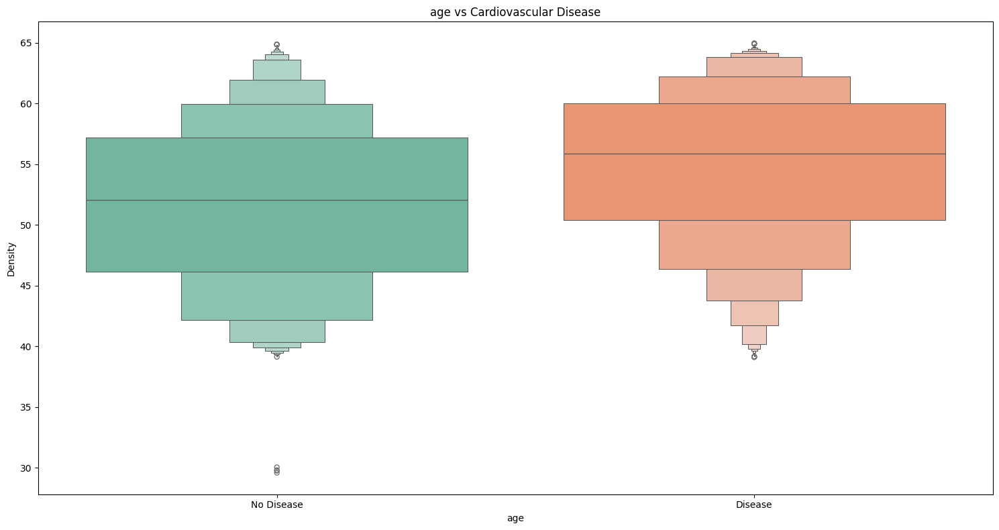

C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\2728011508.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(data= df_cardio , x = "cardio" , y = col ,palette="Set2")


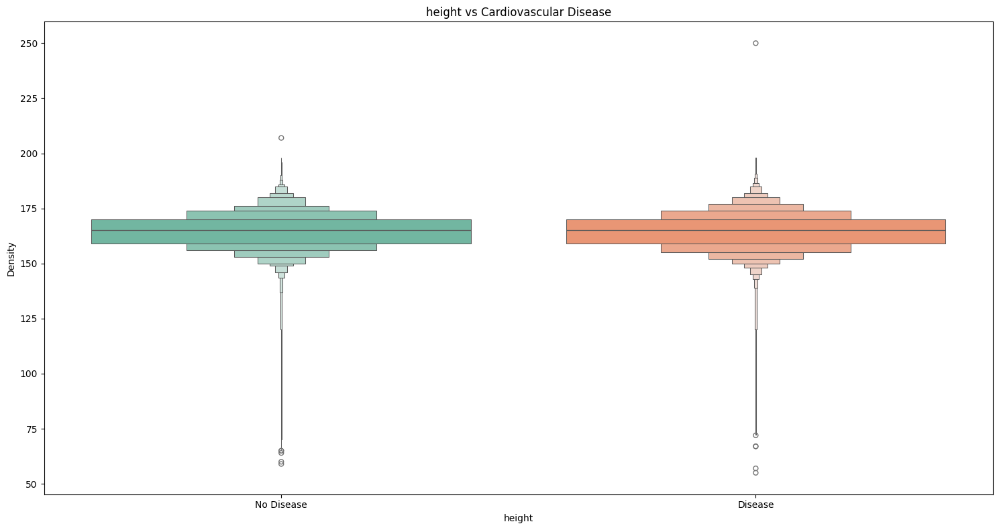

C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\2728011508.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(data= df_cardio , x = "cardio" , y = col ,palette="Set2")


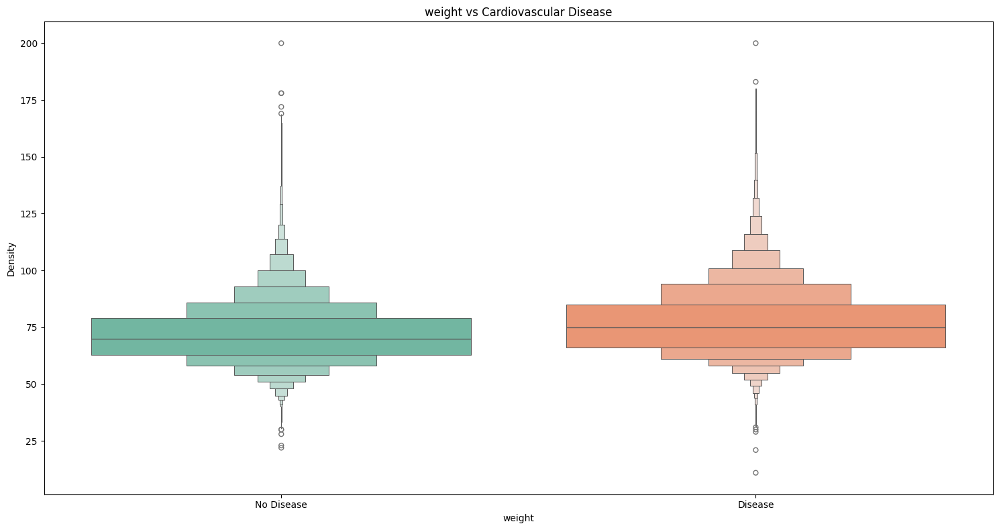

C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\2728011508.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(data= df_cardio , x = "cardio" , y = col ,palette="Set2")


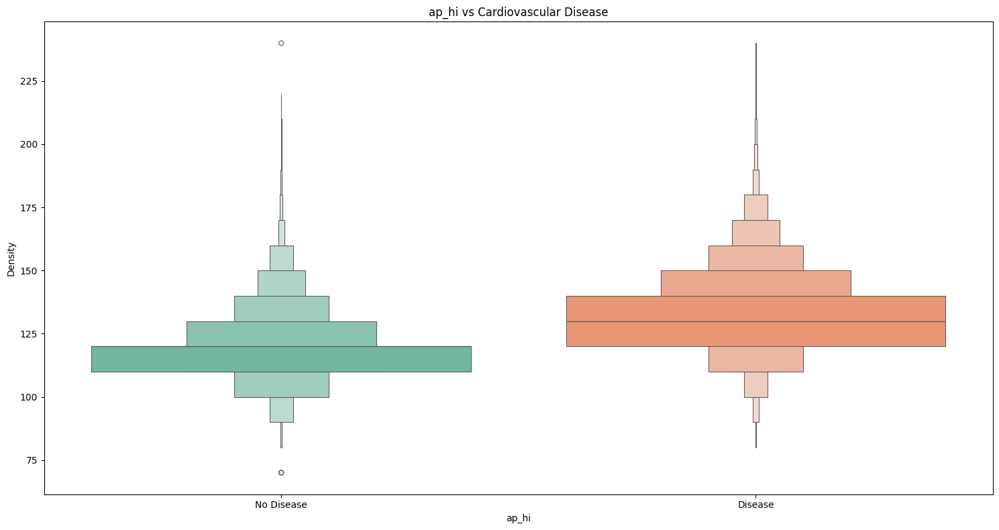

C:\Users\MY HP\AppData\Local\Temp\ipykernel_6972\2728011508.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(data= df_cardio , x = "cardio" , y = col ,palette="Set2")


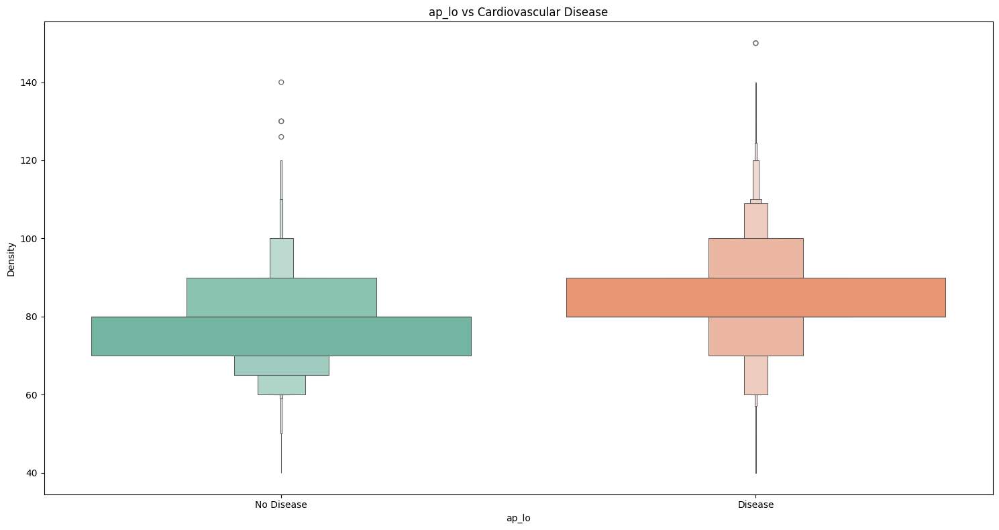

In [47]:
compare_numerical_df_cardio(df_cardio)

#Shapiro-wilk for normality test in numerical data

In [49]:
def shapiro_wilk(df_cardio):
    #H0 = data fallow normal distribution 
    #H1 = data do not fallow normal distribution
    #numerical_columns = ["age", "height", "weight", "ap_hi", "ap_lo"]
    colors = {
        "age": "blue", 
        "height": "green",
        "weight": "orange",
        "ap_hi": "red",
        "ap_lo": "purple"
        }
        
    for  col in numerical_columns:
        statistic , p_value = stats.shapiro(df_cardio[col])
        print(f"column = {col}")
        print(f"statistic = {statistic:.5f}")
        print(f"p_value = {p_value:.5f}")
        if p_value > 0.05:
            print("Normal Distribution")
        else:
            print("Not Normal Distribution")
        plt.figure(figsize=(10,8))
        sns.histplot(df_cardio[col], kde=True , color = colors[col])
        plt.show()

##callingshapiro-wilk for normality test

c:\Users\MY HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68642.
  res = hypotest_fun_out(*samples, **kwds)


column = age
statistic = 0.96600
p_value = 0.00000
Not Normal Distribution


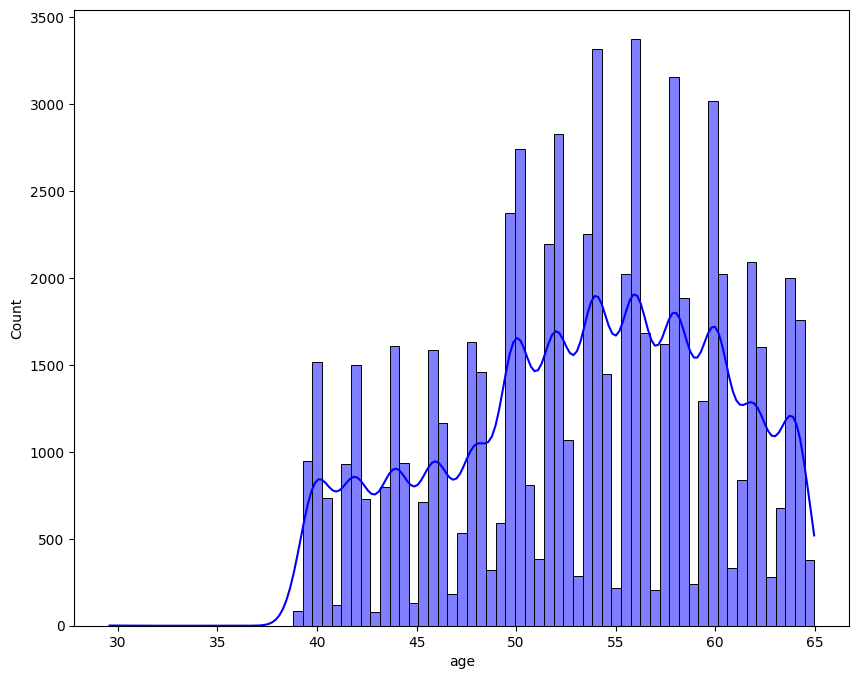

c:\Users\MY HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68642.
  res = hypotest_fun_out(*samples, **kwds)


column = height
statistic = 0.96507
p_value = 0.00000
Not Normal Distribution


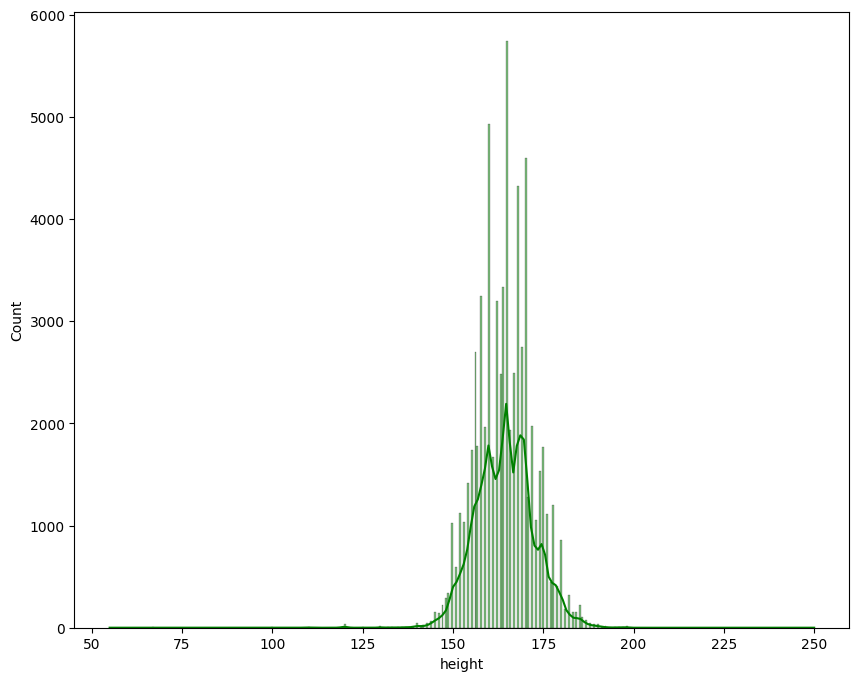

c:\Users\MY HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68642.
  res = hypotest_fun_out(*samples, **kwds)


column = weight
statistic = 0.95410
p_value = 0.00000
Not Normal Distribution


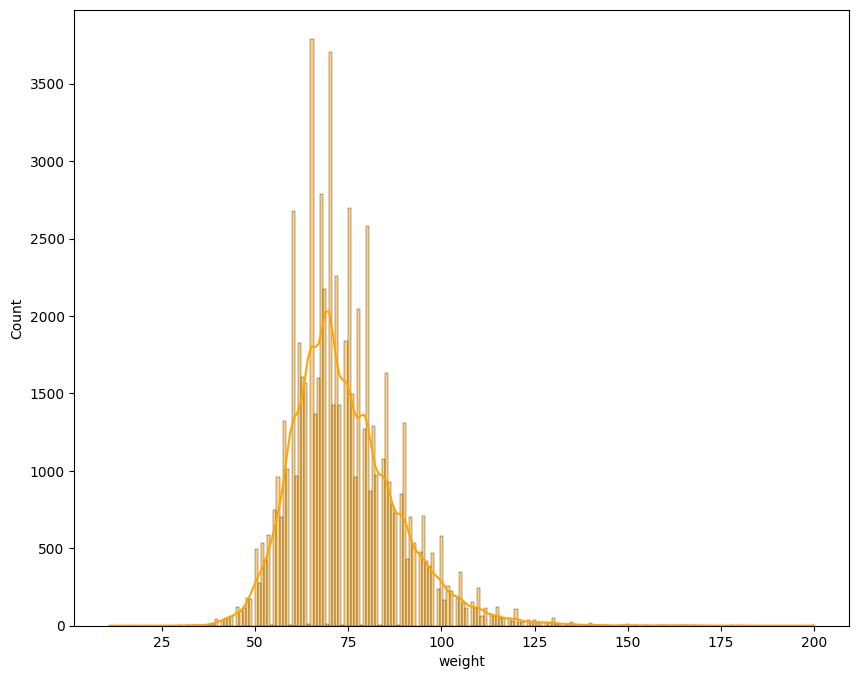

c:\Users\MY HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68642.
  res = hypotest_fun_out(*samples, **kwds)


column = ap_hi
statistic = 0.90894
p_value = 0.00000
Not Normal Distribution


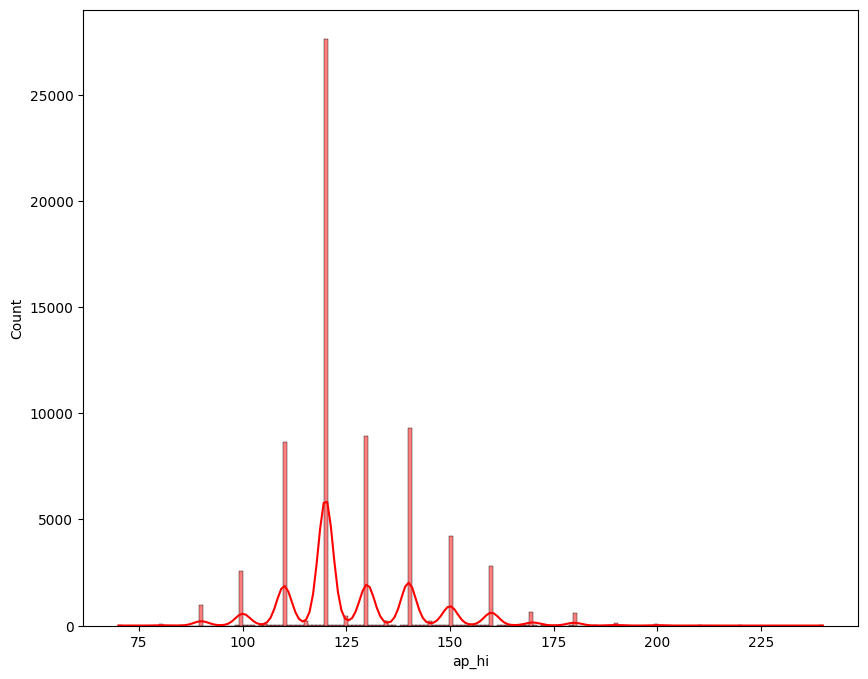

c:\Users\MY HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\scipy\stats\_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68642.
  res = hypotest_fun_out(*samples, **kwds)


column = ap_lo
statistic = 0.88654
p_value = 0.00000
Not Normal Distribution


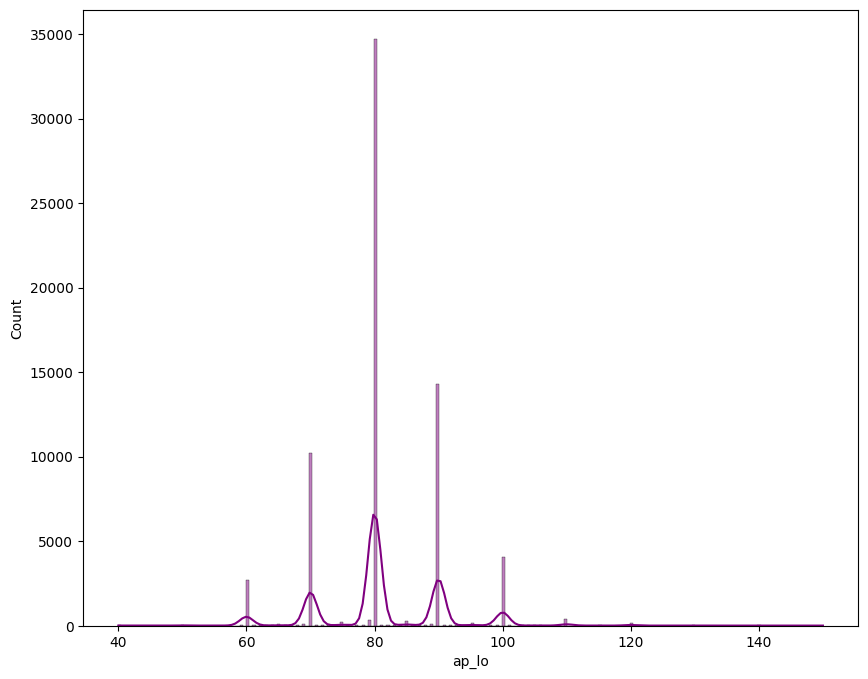

In [50]:
shapiro_wilk(df_cardio)

#Chi_square_test categorical data

In [51]:
def chi_square_test(df_cardio):
    #categorical_columns=["gender" , "cholesterol" , "gluc",  "smoke" , "alco" , "active"]
    labels = {
        "gender": ["Female", "Male"],
        "cholesterol":["Normal", "Above Normal" , "Well Above Normal"],
        "gluc":["Normal", "Above Normal" , "Well Above Normal"],
        "smoke": ["No", "Yes"],
        "alco": ["No", "Yes"],
        "active": ["No", "Yes"],
        "cardio": ["No Disease", "Disease"]
        }
    for col in categorical_columns:
        table_data = pd.crosstab(df_cardio[col] , df_cardio["cardio"])
        print(f"Table {[col]} and Cardio = \n {table_data}")
        chi2 , p_value , dof , expected= chi2_contingency(table_data) 
        print(f" Chi-square = {chi2:.3f}")
        print(f"Degrees of freedom = {dof}")
        print(f"P-value = {p_value:.5f}")
        table_data_percentage = pd.crosstab(df_cardio[col] , df_cardio["cardio"] , normalize = "index")*100
        ax=table_data_percentage.plot(kind = "bar" ,stacked = True , figsize=(10,7) , colormap="viridis")
        for container in ax.containers:
            ax.bar_label(container, fmt="%.1f%%")
        ax.set_xticklabels(labels[col], rotation = 0)
        plt.ylabel("Percentage")
        plt.title(f"{col} vs Cardiovascular Disease")
        plt.legend(["No Disease", "Disease"])
        plt.tight_layout()
        plt.show()

##Calling chi_square_test categorical data

Table ['gender'] and Cardio = 
 cardio      0      1
gender              
1       22701  22005
2       11979  11957
 Chi-square = 3.317
Degrees of freedom = 1
P-value = 0.06858


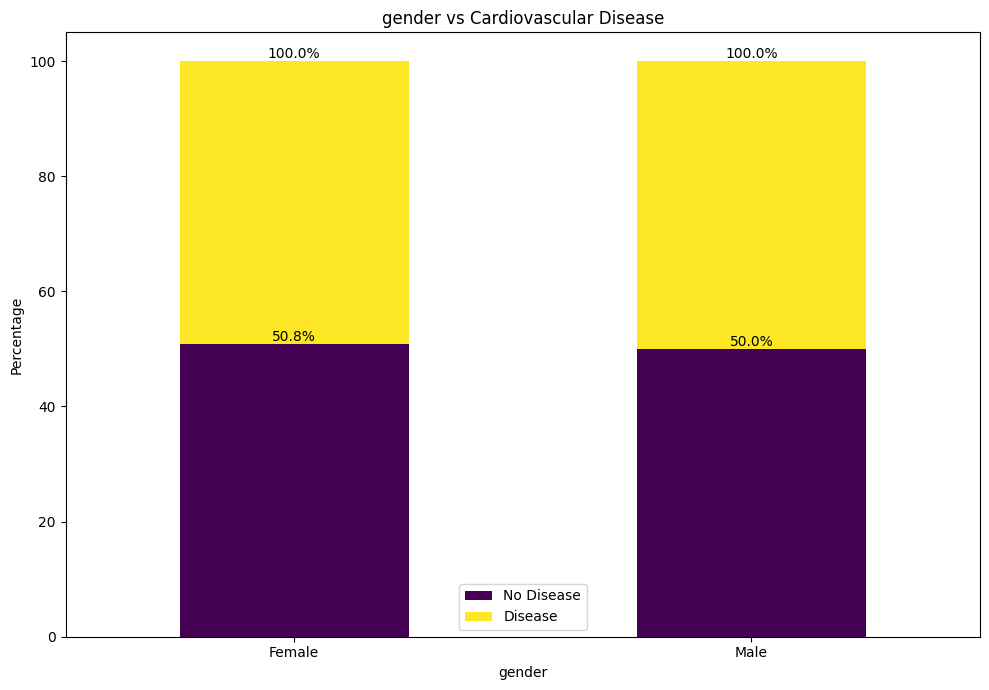

Table ['cholesterol'] and Cardio = 
 cardio           0      1
cholesterol              
1            29058  22415
2             3754   5546
3             1868   6001
 Chi-square = 3366.244
Degrees of freedom = 2
P-value = 0.00000


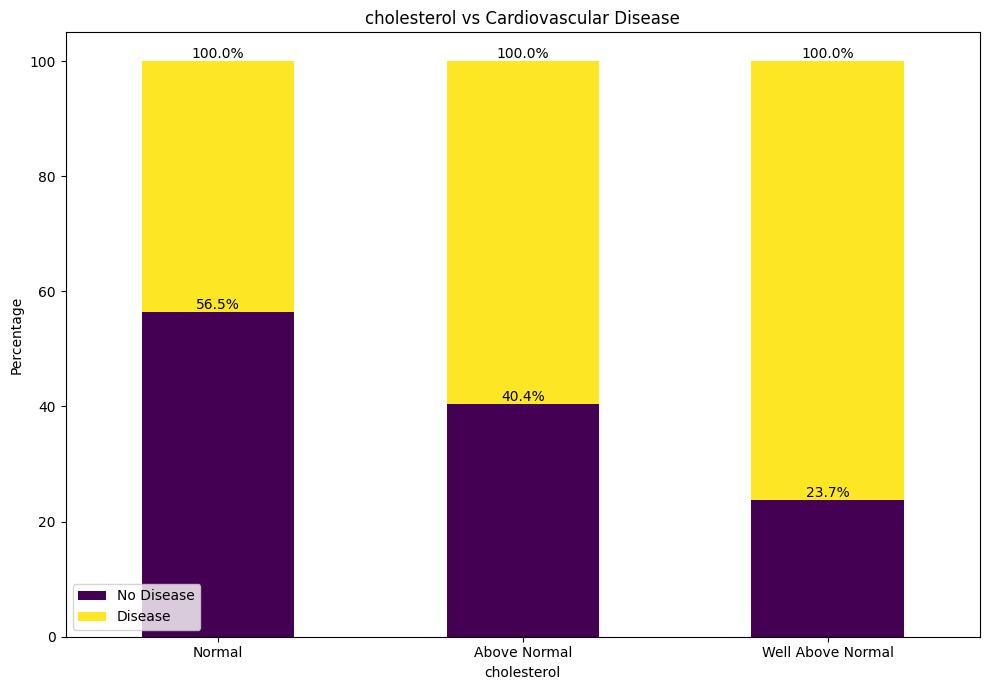

Table ['gluc'] and Cardio = 
 cardio      0      1
gluc                
1       30603  27759
2        2084   2981
3        1993   3222
 Chi-square = 579.633
Degrees of freedom = 2
P-value = 0.00000


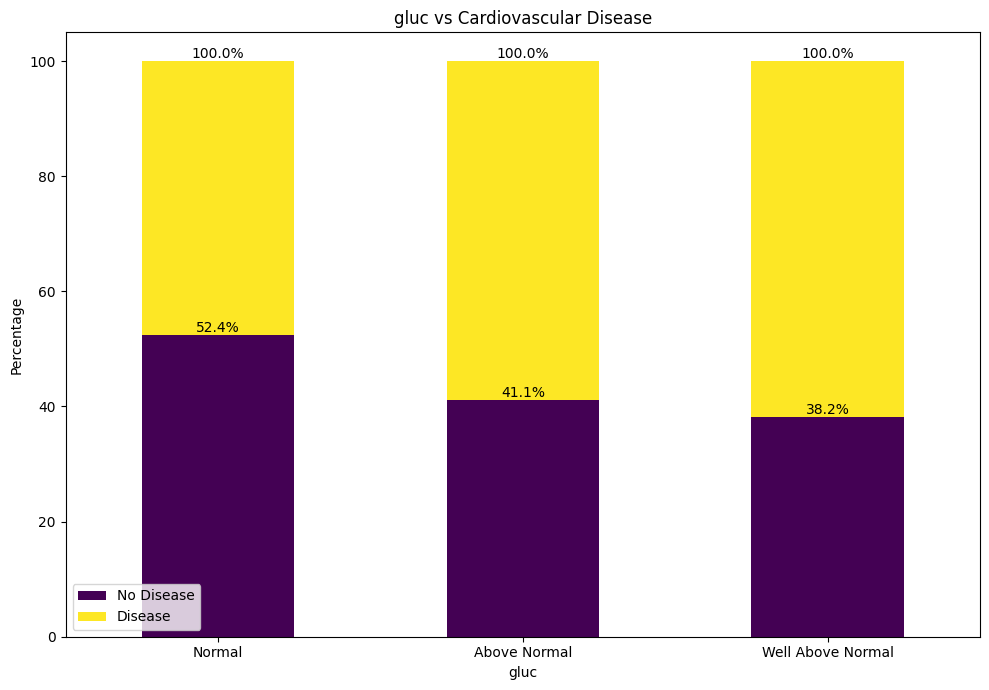

Table ['smoke'] and Cardio = 
 cardio      0      1
smoke               
0       31469  31132
1        3211   2830
 Chi-square = 18.220
Degrees of freedom = 1
P-value = 0.00002


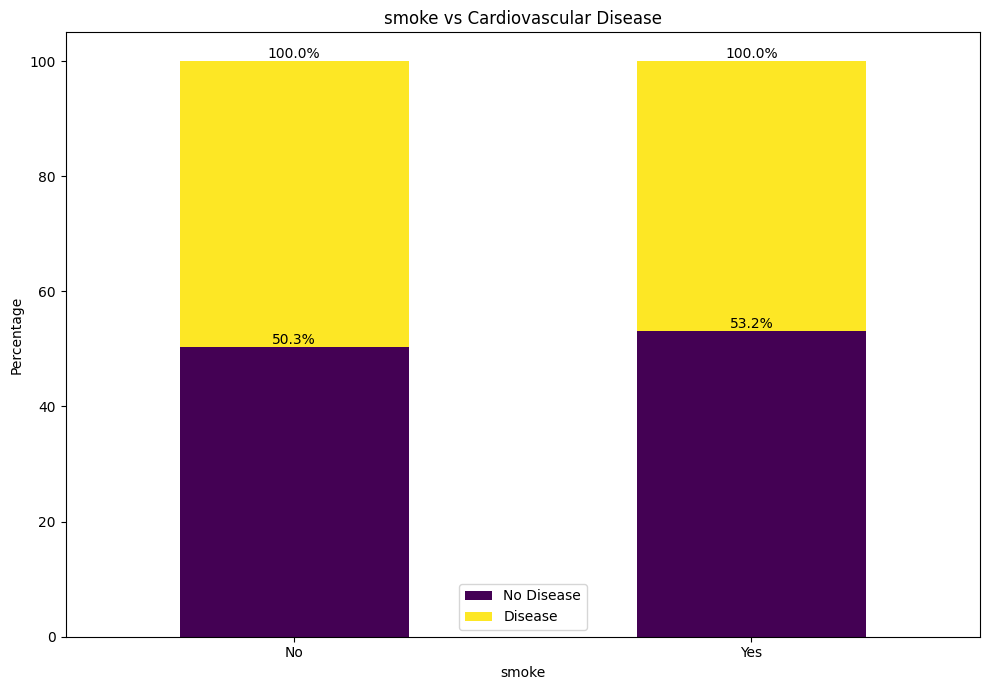

Table ['alco'] and Cardio = 
 cardio      0      1
alco                
0       32761  32217
1        1919   1745
 Chi-square = 5.230
Degrees of freedom = 1
P-value = 0.02220


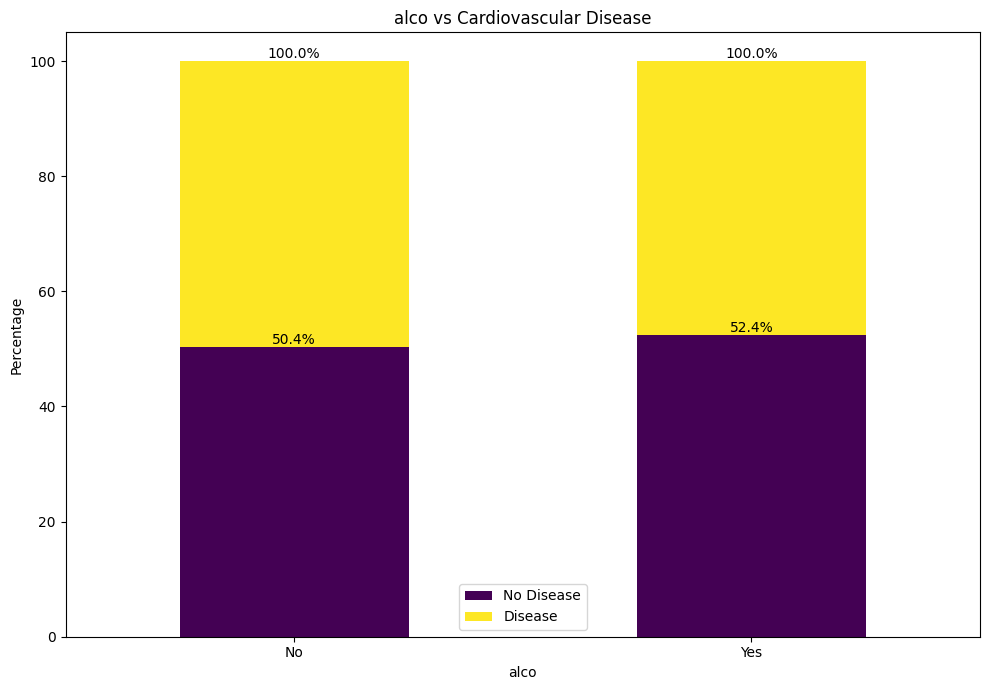

Table ['active'] and Cardio = 
 cardio      0      1
active              
0        6309   7189
1       28371  26773
 Chi-square = 95.991
Degrees of freedom = 1
P-value = 0.00000


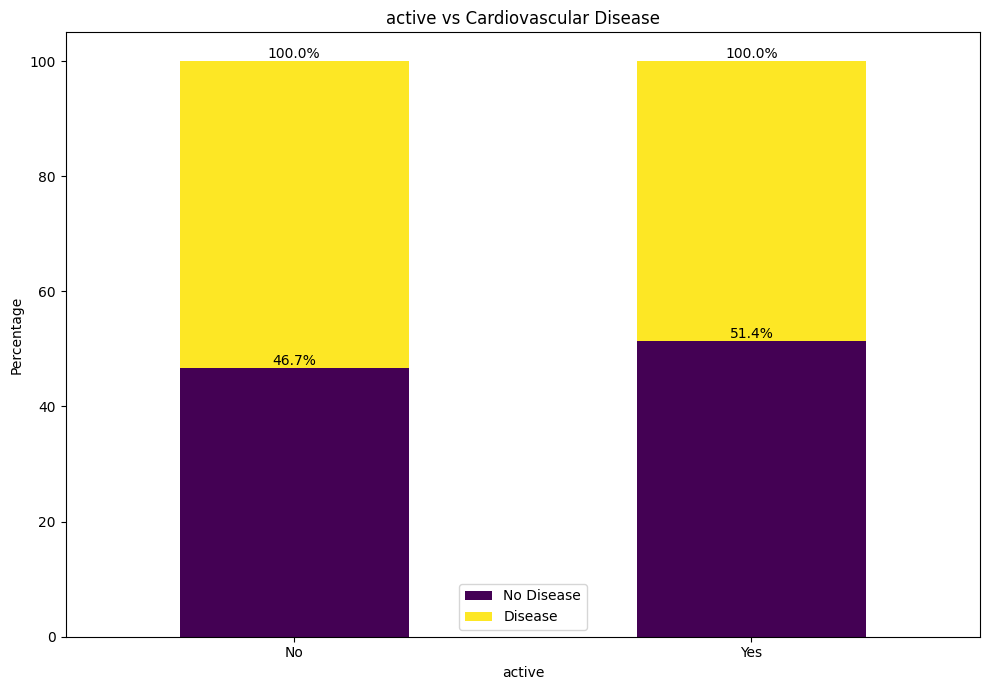

Table ['cardio'] and Cardio = 
 cardio      0      1
cardio              
0       34680      0
1           0  33962
 Chi-square = 68638.000
Degrees of freedom = 1
P-value = 0.00000


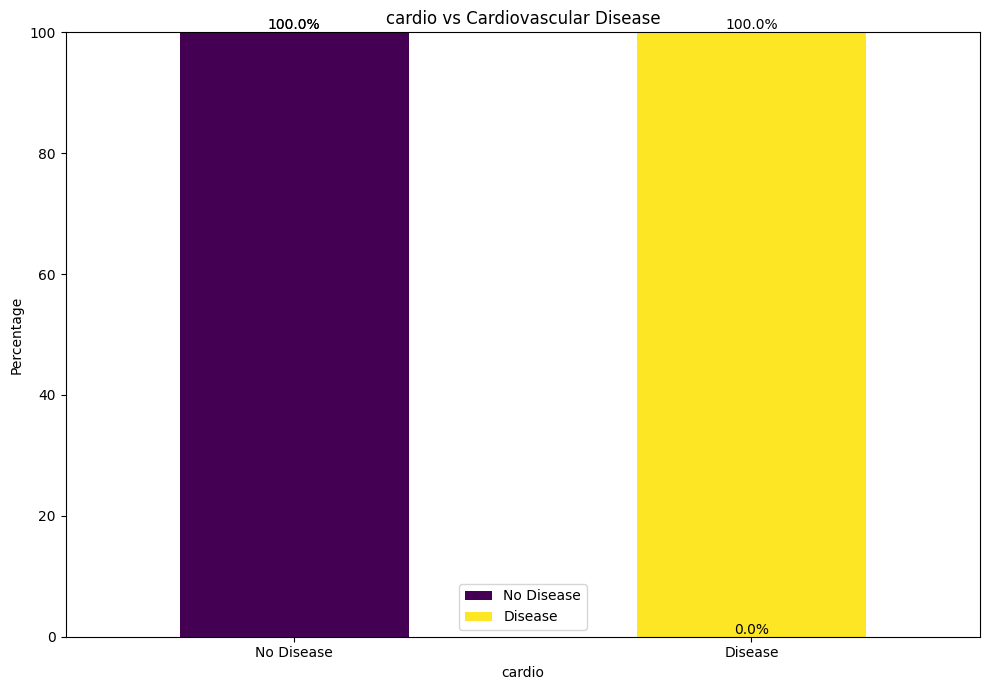

In [53]:
chi_square_test(df_cardio)

#Mann-whitney U Test

In [54]:
def mann_whitney_test(df_cardio):
    #numerical_columns = ["age", "height", "weight", "ap_hi", "ap_lo"]
    for col in numerical_columns:
        healthy_persons=df_cardio.loc[df_cardio["cardio"] == 0 , col]
        patient_persons=df_cardio.loc[df_cardio["cardio"] == 1 , col]
        u_test , p_value = mannwhitneyu(healthy_persons, patient_persons)
        print(f"U-test = {u_test}")
        print(f"p-value = {p_value:.4f}")
        if p_value < 0.05:
            print("Important difference")
        else:
            print("No Important difference")

##Calling Mann-whitney U Test

In [55]:
mann_whitney_test(df_cardio)

U-test = 428496640.0
p-value = 0.0000
Important difference
U-test = 597249505.0
p-value = 0.0013
Important difference
U-test = 466158144.0
p-value = 0.0000
Important difference
U-test = 292945698.0
p-value = 0.0000
Important difference
U-test = 364129149.5
p-value = 0.0000
Important difference


#making BMI

In [56]:
def BMI_data(df_cardio):
    df_cardio["BMI"] = df_cardio["weight"]/((df_cardio["height"]/100)**2)
    BMI_patient = df_cardio.loc[df_cardio["cardio"] == 1 ,"BMI"]
    BMI_health = df_cardio.loc[df_cardio["cardio"] == 0 , "BMI"] 
    print(f"statistacal parameter for BMI=\n {df_cardio["BMI"].describe()}")
    print(f"statistacal parameter for BMI_patient =\n {BMI_patient.describe()}")
    print(f"statistacal parameter for BMI_health =\n {BMI_health.describe()}")
    range_BMI = [0, 18.5, 25, 30, np.inf]
    label_BMI = ["Underweight", "Normal", "Overweight", "Obese"]
    df_cardio["BMI_category"]=pd.cut(df_cardio["BMI"], bins = range_BMI , labels = label_BMI )
    return df_cardio

##Calling make BMI 

In [57]:
BMI_data(df_cardio)

statistacal parameter for BMI=
 count    68642.000000
mean        27.522590
std          6.052576
min          3.471784
25%         23.875115
50%         26.346494
75%         30.119376
max        298.666667
Name: BMI, dtype: float64
statistacal parameter for BMI_patient =
 count    33962.000000
mean        28.527939
std          6.351796
min          3.471784
25%         24.464602
50%         27.434842
75%         31.511502
max        298.666667
Name: BMI, dtype: float64
statistacal parameter for BMI_health =
 count    34680.000000
mean        26.538054
std          5.571425
min          7.022248
25%         23.388687
50%         25.475935
75%         28.763971
max        237.768633
Name: BMI, dtype: float64


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI,BMI_category
0,50.391781,2,168,62.0,110,80,1,1,0,0,1,0,21.967120,Normal
1,55.419178,1,156,85.0,140,90,3,1,0,0,1,1,34.927679,Obese
2,51.663013,1,165,64.0,130,70,3,1,0,0,0,1,23.507805,Normal
3,48.282192,2,169,82.0,150,100,1,1,0,0,1,1,28.710479,Overweight
4,47.873974,1,156,56.0,100,60,1,1,0,0,0,0,23.011177,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,52.712330,2,168,76.0,120,80,1,1,1,0,1,0,26.927438,Overweight
69996,61.920547,1,158,126.0,140,90,2,2,0,0,1,1,50.472681,Obese
69997,52.235615,2,183,105.0,180,90,3,1,0,1,0,1,31.353579,Obese
69998,61.454796,1,163,72.0,135,80,1,2,0,0,0,1,27.099251,Overweight


#Ploting MBI data

In [58]:
def plot_BMI(df_cardio):
    table = pd.crosstab(df_cardio["BMI_category"], df_cardio["cardio"] , normalize = "index" )*100
    print(table.round(3))
    ax = sns.countplot(data=df_cardio, x="BMI_category", hue="cardio", stat="percent", palette="Set2")
    plt.xlabel("BMI Category")
    ax.legend(["No Disease", "Disease"] , title="Cardiovascular")
    for container in ax.containers:
        ax.bar_label(container, fmt="%.3f%%")
    plt.xlabel("BMI_category")
    plt.ylabel("percentage(%)")
    plt.title(f"BMI_category vs Cardiovascular Disease")
    plt.tight_layout()
    plt.show()

##Calling plot MBI data

cardio             0       1
BMI_category                
Underweight   72.473  27.527
Normal        60.203  39.797
Overweight    49.443  50.557
Obese         37.529  62.471


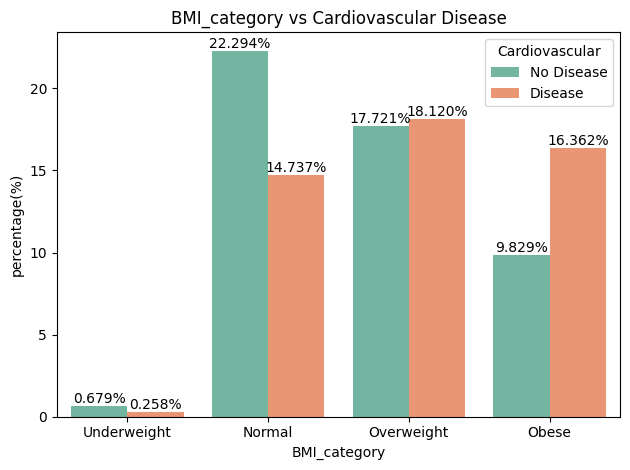

In [60]:
plot_BMI(df_cardio)

#Plot BMI percentage

In [61]:
def plot_percentage(df_cardio):
    table_percentage = pd.crosstab(df_cardio["BMI_category"], df_cardio["cardio"] , normalize = "index" )*100
    ax=table_percentage.plot(kind = "bar" ,stacked = True , figsize=(10,7) , colormap="viridis")
    for container in ax.containers:
        ax.bar_label(container, fmt="%.2f%%")
    plt.xticks(rotation = 0)
    plt.xlabel("BMI_category")
    plt.ylabel("percentage(%)")
    plt.legend(["No Disease", "Disease"], title="Cardiovascular")
    plt.title(f"BMI_category vs Cardiovascular Disease")
    plt.tight_layout()
    plt.show()

##Calling plot BMI percentage

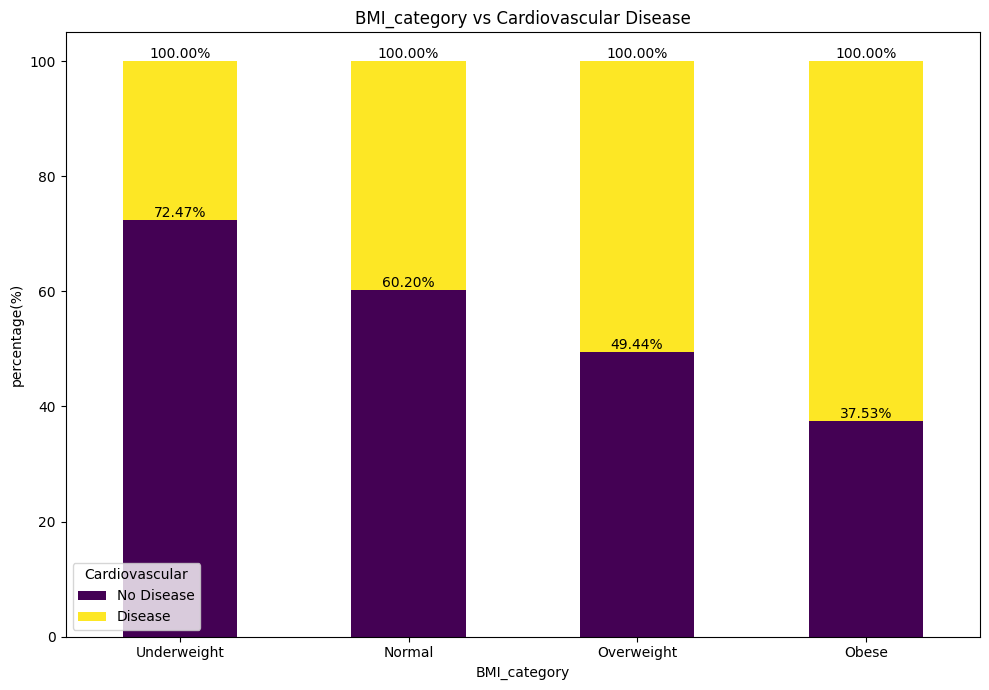

In [62]:
plot_percentage(df_cardio)

#saving data

In [63]:
df_cardio.to_csv("clean_cardio.csv", index=False)